# Итоговый проект по курсу OTUS "ML для финансового анализа" 2024-07

### 1. Задача - провести анализ исторических данных котировок криптовалют (на примере ETH) с использованием инструментов машинного обучения и нейронных сетей для предсказания торговых действий на бирже (покупка, продажа)

### 2. Сбор и очистка данных

In [58]:
from utils.config import COMMON_CONFIG

!pip install matplotlib -q

import warnings
warnings.filterwarnings("ignore")

!pip install pandas -q
import pandas as pd
# Хак чтобы работало на Anaconda под MacOs 10.15.7 Catalina
pd.DataFrame.iteritems = pd.DataFrame.items

!pip install plotly -q

from utils.plots import linear_plot

In [59]:
#!pip install git+https://github.com/kernc/backtesting.py.git -q
!pip install backtesting -q

from backtesting import Strategy
from backtesting.lib import crossover
from backtesting.test import SMA
from utils.backtest import convert_data_to_bt_format, run_backtest

In [60]:
import numpy as np
import os
os.environ['CUBLAS_WORKSPACE_CONFIG'] = ':4096:8'

import random

def seed_everything(seed: int = COMMON_CONFIG.SEED) -> None:
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    print(f"Using {seed} seed")

# Зафиксируем SEED
seed_everything(COMMON_CONFIG.SEED)

Using 777 seed


#### Загрузим данные

In [61]:
from utils.files import read_data_from_file
from utils.data import train_test_split, train_test_split_by_date

df = read_data_from_file(COMMON_CONFIG.DATA_PATH, COMMON_CONFIG.SYMBOL, COMMON_CONFIG.TIMEFRAME)
df

,open,high,low,close,volume
date,,,,,
2020-01-01 00:00:00,129.16,129.19,128.68,128.87,7769.17336
2020-01-01 01:00:00,128.87,130.65,128.78,130.64,11344.65516
2020-01-01 02:00:00,130.63,130.98,130.35,130.85,7603.35623
2020-01-01 03:00:00,130.85,130.89,129.94,130.20,4968.55433
2020-01-01 04:00:00,130.21,130.74,130.15,130.20,3397.90747
...,...,...,...,...,...
2025-01-26 16:00:00,3315.31,3320.00,3307.96,3315.82,6878.43040
2025-01-26 17:00:00,3315.83,3344.88,3315.36,3338.04,9465.04360
2025-01-26 18:00:00,3338.03,3342.92,3334.02,3337.16,8731.04880


In [62]:
linear_plot(x=df.index, y=df['close'], title = 'ETH/USDT')

In [63]:
#Сформируем данные для бэктестинга
df_for_bt = df.copy()
df_for_bt

,open,high,low,close,volume
date,,,,,
2020-01-01 00:00:00,129.16,129.19,128.68,128.87,7769.17336
2020-01-01 01:00:00,128.87,130.65,128.78,130.64,11344.65516
2020-01-01 02:00:00,130.63,130.98,130.35,130.85,7603.35623
2020-01-01 03:00:00,130.85,130.89,129.94,130.20,4968.55433
2020-01-01 04:00:00,130.21,130.74,130.15,130.20,3397.90747
...,...,...,...,...,...
2025-01-26 16:00:00,3315.31,3320.00,3307.96,3315.82,6878.43040
2025-01-26 17:00:00,3315.83,3344.88,3315.36,3338.04,9465.04360
2025-01-26 18:00:00,3338.03,3342.92,3334.02,3337.16,8731.04880


In [64]:
!pip install summarytools -q

from summarytools import dfSummary

dfSummary(df)

No,Variable,Stats / Values,Freqs / (% of Valid),Graph,Missing
1,open[float64],Mean (sd) : 2000.2 (1150.9)min < med < max:96.5 < 1878.3 < 4846.9IQR (CV) : 1677.4 (1.7),"40,382 distinct values","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuNSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/xnp5ZAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACu0lEQVR4nO3cP47aQBiH4d+EBRlQjBARdFwgUgpKmtwgh02bLgV7gb3BNggJGRBkEX/TRCuihCz2eMJ81vv0xlO8QjOesd35fBYQu3f3HgBwi4d7DyAU51xTUsPjJ3bn8/mlrPHATyVDdc41e73elzRNu0V/Y7VaZc65r8Qah0qGKqmRpml3PB6/dDqdbd6Ll8tlMplMuvP5vCGJUCNQ1VAlSZ1OZ9vv938UvLxZ6mDghcUUTCBUmECoMIFQYQKhwgRChQmEChMIFSYQKkwgVJhAqDCBUGECocKEN09PeR5A5vAxSvHPUH0PIHP4GGV56x+18AFkDh+jTDcdnPY4gMzhY5SCxRRMIFSYQKgwgVBhAqHCBEKFCYQKEwgVJhAqTCBUmECoMIFQYUKlv+ZnER8g/jtCjQgfIL6OUOPCB4ivINQI8QHiP7GYggn8o15xPB7rklLnXJHLK7mguaeoQ/VYAaen06le9L6bzaa+3+8/DYfDWq1Wyz1XXCwWa+fcN0l5r/Uad5VFG6rPCni/3yfH4/Hjdrv9Lin3XG+32z0kSdIajUbbwWCQ5bl2Op2+f3x8/DwcDj/kjdx33FUWbajyWAE/Pz93n56eWofDoeYzgHa7nXtRk2VZs2jkZY27imIOVVKxFXCWZXdf+RaNPNR4rGPVDxMIFSYQKkyIfo6KfKr6/JdQK8T3+W/MB1oItUJ8nv/GfqCFUCuoyKOxX6J9PMZiCiYQKkwgVJhAqDCBUGECocIEQoUJPEfFK8/tVyngFiyhQpL/9qsUdguWUCHJb/tVCr8FS6j4jcf2qxRwCzZoqJ5zHt7IxKtgofrOeXgjE5eCheo75+GNTFwKPkctOufhjUx7Qr5dwGIKpQj9dgGhohSh3y64KdTlcpnkubEkrdfrRJI2m00ym81a//N6q/e2Ou7L60P5CYmurAL/qp3hAAAAAElFTkSuQmCC"">",0(0.0%)
2,high[float64],Mean (sd) : 2011.0 (1157.1)min < med < max:105.7 < 1886.0 < 4868.0IQR (CV) : 1687.0 (1.7),"38,370 distinct values","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuNSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/xnp5ZAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACsklEQVR4nO3cQY7aMBSA4ecyoABSEKKCHReo1AVLDtHD9ghF4gTcgB1ShIJIJyKEdFONqDp0SBw3ftb/7TPx4lfGxk5MVVUC+O5T1wMAnvHS9QBcMcYMRWRg8ScuVVW9tjUe2AkyVGPMcDabfYvjeNr0b5xOp6Mx5jux+iHIUEVkEMfxdL1ev04mk7zuxWmaRtvtdpokyUBECNUDoYYqIiKTySSfz+c/G14+bHUwsMJiCioQKlQgVKhAqFCBUKECoUIFQoUKhAoVCBUqECpUIFSoQKhQgVChwoenpywPIHP4GK34Z6i2B5A5fIy2fPREbXwAmcPHaNNTB6ctDiBz+BitYDEFFQgVKhAqVCBUqECoUIFQoQKhQgVChQqEChUIFSoQKlQgVKgQ9Nf8NOIDxO8jVI/wAeLHCNUvfID4AUL1EB8g/huhPlCWZV9EYmNMk8uDnCd2iVDfkWVZvyiKr8vlstfr9Wr/Cw51ntglr0O1WAHHt9ut3/S+l8vlJYqi0Wq1yheLxbHOtWmaRpvNZp4kyWdjzKnmra3GHTJvQ7VZARdFEZVl+SXP8x8i0nSuJ+PxuPZc0eZp3Na4Q+RtqGKxAt7v99Pdbje6Xq89V4N7xOZp3OW4fedzqCLSbAV8PB47X/k2eRr7MG5fsYUKFQgVKhAqVPB+jop6Qt2oINSAhLxRQagBsd2o8PlAC6EGqMlPY795+/MYiymoQKhQgVChAqFCBUKFCoQKFQgVKvA7Kt5Ybr+KONyCJVSIiP32q4jbLVhChYjYbb+KuN+CJVT8wWL7VcThFqzTUC3nPLyRiTfOQrWd8/BGJu45C9V2zsMbmbjnfI7adM7DG5n6uHy7gMUUWuH67QJCRStcv13wVKhpmkZ1biwicj6fIxGRLMuiw+Ew+p/Xa7231nHfX+/KL83DuLcY1QQQAAAAAElFTkSuQmCC"">",0(0.0%)
3,low[float64],Mean (sd) : 1988.5 (1144.2)min < med < max:86.0 < 1872.0 < 4833.2IQR (CV) : 1669.4 (1.7),"38,677 distinct values","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuNSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/xnp5ZAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACu0lEQVR4nO3cP47aQBiH4d+EBRlQjBARdFwgUgpKmtwgh02bLgV7gb3BNggJGRBkEX/TRCuihCz2eMJ81vv0xlO8QjOesd35fBYQu3f3HgBwi4d7DyAU51xTUsPjJ3bn8/mlrPHATyVDdc41e73elzRNu0V/Y7VaZc65r8Qah0qGKqmRpml3PB6/dDqdbd6Ll8tlMplMuvP5vCGJUCNQ1VAlSZ1OZ9vv938UvLxZ6mDghcUUTCBUmECoMIFQYQKhwgRChQmEChMIFSYQKkwgVJhAqDCBUGECocKEN09PeR5A5vAxSvHPUH0PIHP4GGV56x+18AFkDh+jTDcdnPY4gMzhY5SCxRRMIFSYQKgwgVBhAqHCBEKFCYQKEwgVJhAqTCBUmECoMIFQYUKlv+ZnER8g/jtCjQgfIL6OUOPCB4ivINQI8QHiP7GYggn8o15xPB7rklLnXJHLK7mguaeoQ/VYAaen06le9L6bzaa+3+8/DYfDWq1Wyz1XXCwWa+fcN0l5r/Uad5VFG6rPCni/3yfH4/Hjdrv9Lin3XG+32z0kSdIajUbbwWCQ5bl2Op2+f3x8/DwcDj/kjdx33FUWbajyWAE/Pz93n56eWofDoeYzgHa7nXtRk2VZs2jkZY27imIOVVKxFXCWZXdf+RaNPNR4rGPVDxMIFSYQKkyIfo6KfKr6/JdQK8T3+W/MB1oItUJ8nv/GfqCFUCuoyKOxX6J9PMZiCiYQKkwgVJhAqDCBUGECocIEQoUJPEfFK8/tVyngFiyhQpL/9qsUdguWUCHJb/tVCr8FS6j4jcf2qxRwCzZoqJ5zHt7IxKtgofrOeXgjE5eCheo75+GNTFwKPkctOufhjUx7Qr5dwGIKpQj9dgGhohSh3y64KdTlcpnkubEkrdfrRJI2m00ym81a//N6q/e2Ou7L60P5CYmurAL/qp3hAAAAAElFTkSuQmCC"">",0(0.0%)
4,close[float64],Mean (sd)

In [65]:
df.isnull().sum()

open      0
high      0
low       0
close     0
volume    0
dtype: int64

In [66]:
df.describe()

,open,high,low,close,volume
count,44435.000000,44435.000000,44435.000000,44435.000000,44435.000000
mean,2000.152766,2011.040867,1988.490069,2000.224220,26816.846488
std,1150.946621,1157.123572,1144.233627,1150.930255,29147.269025
min,96.510000,105.690000,86.000000,96.620000,161.748770
25%,1262.090000,1267.150000,1253.690000,1262.170000,10124.839750
50%,1878.300000,1886.000000,1872.030000,1878.300000,18141.649700
75%,2939.510000,2954.150000,2923.125000,2939.790000,32639.868675
max,4846.940000,4868.000000,4833.190000,4846.710000,493227.882820


#### Посмотрим на базовое поведение модели на основе самой простой стратегии скользящих средних

In [67]:
class SmaCross(Strategy):
    n1 = 50
    n2 = 200
    
    def init(self):
        self.sma1 = self.I(SMA, self.data.Close, self.n1)
        self.sma2 = self.I(SMA, self.data.Close, self.n2)
    
    def next(self):
        if crossover(self.sma1, self.sma2):
            self.position.close()
            self.buy()

        elif crossover(self.sma2, self.sma1):
            self.position.close()
            self.sell()

In [68]:
bt_data = convert_data_to_bt_format(df_for_bt.reset_index())
_, bt_test_data = train_test_split(bt_data)
bt_test_data

Train size: 35650, Test size: 8785


,Open,High,Low,Close,Volume
Datetime,,,,,
2024-01-26 20:00:00,2258.51,2262.69,2252.49,2258.60,11646.5910
2024-01-26 21:00:00,2258.60,2260.87,2253.00,2259.87,6455.0093
2024-01-26 22:00:00,2259.86,2272.00,2258.01,2268.01,6966.3637
2024-01-26 23:00:00,2268.01,2270.27,2263.99,2267.68,7176.1758
2024-01-27 00:00:00,2267.67,2280.31,2265.23,2280.18,12034.2632
...,...,...,...,...,...
2025-01-26 16:00:00,3315.31,3320.00,3307.96,3315.82,6878.4304
2025-01-26 17:00:00,3315.83,3344.88,3315.36,3338.04,9465.0436
2025-01-26 18:00:00,3338.03,3342.92,3334.02,3337.16,8731.0488


In [69]:
linear_plot(x = bt_test_data.index, y = bt_test_data['Close'], title = 'ETH/USDT backtest data')

In [70]:
_ = run_backtest(bt_test_data, SmaCross)

Start                     2024-01-26 20:00:00
End                       2025-01-26 20:00:00
Duration                    366 days 00:00:00
Exposure Time [%]                   97.245304
Equity Final [$]                  737185.3807
Equity Peak [$]                 1832442.44282
Return [%]                         -26.281462
Buy & Hold Return [%]               47.794209
Return (Ann.) [%]                  -26.158864
Volatility (Ann.) [%]               50.618671
Sharpe Ratio                        -0.516783
Sortino Ratio                       -0.620525
Calmar Ratio                        -0.424031
Max. Drawdown [%]                  -61.690983
Avg. Drawdown [%]                    -2.46666
Max. Drawdown Duration      312 days 15:00:00
Avg. Drawdown Duration        5 days 07:00:00
# Trades                                   56
Win Rate [%]                        30.357143
Best Trade [%]                      60.339059
Worst Trade [%]                    -12.524925
Avg. Trade [%]                    

### 3. Технический анализ

In [71]:
!pip install pandas_ta -q

from utils.ta import enrich_with_ta, get_trade_signals, get_best_params

In [72]:
class TechAnalysisStrategy(Strategy):
    def init(self):
        self.signal = self.I(lambda: self.data.Signal)
        self.previous_signal = 0

    def next(self):
        current_signal = self.signal[-1]

        if current_signal == 1:
            self.position.close()
            self.buy()

        elif current_signal == -1:
            self.position.close()
            self.sell()

        self.previous_signal = current_signal

In [73]:
ta_data, _ = enrich_with_ta(df_for_bt.reset_index(), {
    'RSI_period': 14,
    'fastMACD_period': 12,
    'slowMACD_period': 26,
    'signalMACD_period': 9
})
data_with_ta_signals = get_trade_signals(ta_data)
bt_data = convert_data_to_bt_format(data_with_ta_signals)
_, bt_test_data = train_test_split(bt_data)
_ = run_backtest(bt_test_data, TechAnalysisStrategy)

Train size: 35650, Test size: 8785


Start                     2024-01-26 20:00:00
End                       2025-01-26 20:00:00
Duration                    366 days 00:00:00
Exposure Time [%]                   81.696073
Equity Final [$]                   774799.303
Equity Peak [$]                 1423793.85566
Return [%]                          -22.52007
Buy & Hold Return [%]               47.794209
Return (Ann.) [%]                  -22.412261
Volatility (Ann.) [%]                59.12497
Sharpe Ratio                        -0.379066
Sortino Ratio                       -0.488253
Calmar Ratio                        -0.363709
Max. Drawdown [%]                  -61.621378
Avg. Drawdown [%]                   -4.655837
Max. Drawdown Duration      250 days 17:00:00
Avg. Drawdown Duration       12 days 11:00:00
# Trades                                   31
Win Rate [%]                        38.709677
Best Trade [%]                      26.142154
Worst Trade [%]                     -20.37895
Avg. Trade [%]                    

In [74]:
best_ta_params = get_best_params(df_for_bt.reset_index(), TechAnalysisStrategy, COMMON_CONFIG.TA_MAX_STAT)

Выполняем backtesting для параметров {'RSI_period': 14, 'fastMACD_period': 6, 'slowMACD_period': 19, 'signalMACD_period': 4}
Получен результат 0.9752227518561347
Выполняем backtesting для параметров {'RSI_period': 14, 'fastMACD_period': 6, 'slowMACD_period': 19, 'signalMACD_period': 7}
Получен результат 1.0812660588674965
Выполняем backtesting для параметров {'RSI_period': 14, 'fastMACD_period': 6, 'slowMACD_period': 19, 'signalMACD_period': 9}
Получен результат 1.1238106663438394
Выполняем backtesting для параметров {'RSI_period': 14, 'fastMACD_period': 6, 'slowMACD_period': 26, 'signalMACD_period': 4}
Получен результат 1.1690137771570082
Выполняем backtesting для параметров {'RSI_period': 14, 'fastMACD_period': 6, 'slowMACD_period': 26, 'signalMACD_period': 7}
Получен результат 1.2906880976073645
Выполняем backtesting для параметров {'RSI_period': 14, 'fastMACD_period': 6, 'slowMACD_period': 26, 'signalMACD_period': 9}
Получен результат 1.3012261469571063
Выполняем backtesting для па

In [18]:
ta_data, _ = enrich_with_ta(df_for_bt.reset_index(), best_ta_params)
data_with_ta_signals = get_trade_signals(ta_data)
bt_data = convert_data_to_bt_format(data_with_ta_signals)
_, bt_best_params_test_data = train_test_split(bt_data)
_ = run_backtest(bt_best_params_test_data, TechAnalysisStrategy)

Train size: 35650, Test size: 8785


Start                     2024-01-26 20:00:00
End                       2025-01-26 20:00:00
Duration                    366 days 00:00:00
Exposure Time [%]                   86.659078
Equity Final [$]                1154838.65914
Equity Peak [$]                 1418872.02964
Return [%]                          15.483866
Buy & Hold Return [%]               47.794209
Return (Ann.) [%]                   15.393301
Volatility (Ann.) [%]               79.633683
Sharpe Ratio                         0.193301
Sortino Ratio                        0.379533
Calmar Ratio                         0.361856
Max. Drawdown [%]                  -42.539863
Avg. Drawdown [%]                   -7.072299
Max. Drawdown Duration      193 days 23:00:00
Avg. Drawdown Duration       14 days 10:00:00
# Trades                                   21
Win Rate [%]                        38.095238
Best Trade [%]                      46.273118
Worst Trade [%]                    -14.666397
Avg. Trade [%]                    

In [19]:
bt_best_params_test_data_to_save = bt_best_params_test_data.copy()
bt_best_params_test_data_to_save.index.name = 'Datetime'
bt_best_params_test_data_to_save.to_csv(COMMON_CONFIG.BT_BEST_PARAMS_TA_TEST_DATA_FILE)

### 4. Машинное обучение

In [20]:
!pip install scikit-learn -q

import numpy as np

# Функция для добавления целевой переменной (таргета)
def add_target(_df):
    _df['close_next_period'] = _df['close'].shift(COMMON_CONFIG.ML_TARGET_NEXT_PERIOD_OFFSET)
    _df['target'] = (_df['close_next_period'] > _df['close']).astype(int)
    _df = _df.dropna(subset=['close_next_period', 'target'])
    return _df

#### Обучение моделей будем производить, добавив доп признаки тех анализа

In [21]:
ta_data, ta_columns = enrich_with_ta(df.reset_index(), best_ta_params)
ta_data

,date,open,high,low,close,volume,macd,macd_signal,macd_hist,RSI
0,2020-01-01 00:00:00,129.16,129.19,128.68,128.87,7769.17336,NaN,NaN,NaN,NaN
1,2020-01-01 01:00:00,128.87,130.65,128.78,130.64,11344.65516,NaN,NaN,NaN,NaN
2,2020-01-01 02:00:00,130.63,130.98,130.35,130.85,7603.35623,NaN,NaN,NaN,NaN
3,2020-01-01 03:00:00,130.85,130.89,129.94,130.20,4968.55433,NaN,NaN,NaN,NaN
4,2020-01-01 04:00:00,130.21,130.74,130.15,130.20,3397.90747,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
44430,2025-01-26 16:00:00,3315.31,3320.00,3307.96,3315.82,6878.43040,-3.508672,-0.868001,-2.640672,46.892013
44431,2025-01-26 17:00:00,3315.83,3344.88,3315.36,3338.04,9465.04360,-1.693211,-1.033043,-0.660168,57.223587
44432,2025-01-26 18:00:00,3338.03,3342.92,3334.02,3337.16,8731.04880,-0.260526,-0.878539,0.618013,56.752701
44433,2025-01-26 19:00:00,3337.17,3341.95,3329.62,3338.74,7563.72820,1.052454,-0.492341,1.544795,57.430036


In [22]:
def create_trend_features(df, features, lag_periods):
    """
    Добавляет классические финансовые признаки: отношение к предыдущим периодам, логарифмические изменения и индикаторы трендов.
    
    df: DataFrame с исходными данными
    features: список признаков, для которых необходимо добавить индикаторы
    lag_periods: сколько периодов назад учитывать для расчетов
    
    Возвращает:
    - обновленный DataFrame с новыми фичами
    - список новых колонок, которые можно использовать как признаки
    """
    df = df.copy()  # Работаем с копией DataFrame
    new_columns = []  # Список для хранения новых колонок
    
    for feature in features:
        # Отношение текущего значения к предыдущему (лаг = 1)
        df[f'{feature}_ratio_1'] = df[feature] / df[feature].shift(1)
        new_columns.append(f'{feature}_ratio_1')
        
        # Логарифмическое изменение (логарифм отношения текущего значения к предыдущему)
        df[f'{feature}_log_diff_1'] = np.log(df[feature] / df[feature].shift(1))
        new_columns.append(f'{feature}_log_diff_1')
        
        # Momentum (разница между текущим значением и значением N периодов назад)
        df[f'{feature}_momentum_{lag_periods}'] = df[feature] - df[feature].shift(lag_periods)
        new_columns.append(f'{feature}_momentum_{lag_periods}')
        
        # Rate of Change (ROC): процентное изменение за N периодов
        df[f'{feature}_roc_{lag_periods}'] = (df[feature] - df[feature].shift(lag_periods)) / df[feature].shift(lag_periods) * 100
        new_columns.append(f'{feature}_roc_{lag_periods}')
        
        # Exponential Moving Average (EMA) с периодом N
        df[f'{feature}_ema_{lag_periods}'] = df[feature].ewm(span=lag_periods, adjust=False).mean()
        new_columns.append(f'{feature}_ema_{lag_periods}')
    
    # Удаление строк с NaN значениями, которые появились из-за сдвигов
    df = df.dropna()
    
    return df, new_columns

In [23]:
def create_lag_features(df, features, lag_periods):
    """
    Добавляет лаги для указанных признаков на указанное количество периодов назад.
    
    df: DataFrame с исходными данными
    features: список признаков, для которых необходимо добавить лаги
    lag_periods: сколько лагов назад необходимо создать
    Возвращает: 
    - обновленный DataFrame с лагами
    - список новых колонок, которые можно использовать как признаки
    """
    df = df.copy()  # Работаем с копией DataFrame
    new_columns = []  # Список для хранения новых колонок
    
    # Для каждого признака создаем лаги
    for feature in features:
        for lag in range(1, lag_periods + 1):
            new_col_name = f'{feature}_lag_{lag}'
            df[new_col_name] = df[feature].shift(lag)
            new_columns.append(new_col_name)
    
    # Удаляем строки с NaN значениями, которые появились из-за сдвигов
    df = df.dropna()
    
    return df, new_columns

In [24]:
# Добавляем целевую переменную (таргет)
ta_data_with_target = add_target(ta_data)

# Параметры для создания трендовых признаков
lag_periods = 3  # Например, 3 периода назад
#features_to_trend = ['open', 'high', 'low', 'close', 'volume']
features_to_trend = ['close']
features_to_lag = ['close']

# Создаем трендовые признаки
ta_data_with_target_and_trend, new_trend_features = create_trend_features(ta_data_with_target, features_to_trend, lag_periods)

ta_data_with_target_and_trend

,date,open,high,low,close,volume,macd,macd_signal,macd_hist,RSI,close_next_period,target,close_ratio_1,close_log_diff_1,close_momentum_3,close_roc_3,close_ema_3
46,2020-01-02 22:00:00,127.72,127.76,127.24,127.39,2654.51024,-1.247498,-1.003764,-0.243734,34.767283,127.19,0,0.997416,-0.002587,-0.23,-0.180223,127.479789
47,2020-01-02 23:00:00,127.39,127.48,126.91,127.19,2980.68108,-1.280220,-1.059055,-0.221164,33.500954,127.07,0,0.998430,-0.001571,0.03,0.023592,127.334894
48,2020-01-03 00:00:00,127.19,127.60,126.82,127.07,7303.34389,-1.308625,-1.108969,-0.199656,32.730643,126.04,0,0.999057,-0.000944,-0.65,-0.508926,127.202447
49,2020-01-03 01:00:00,127.07,127.17,125.88,126.04,12202.68649,-1.409122,-1.169000,-0.240122,26.993357,126.92,1,0.991894,-0.008139,-1.35,-1.059738,126.621224
50,2020-01-03 02:00:00,126.04,127.08,125.90,126.92,14356.43191,-1.409136,-1.217027,-0.192109,37.132641,126.89,0,1.006982,0.006958,-0.27,-0.212281,126.770612
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44429,2025-01-26 15:00:00,3311.09,3320.68,3308.74,3315.31,7303.58720,-3.436288,-0.207833,-3.228455,46.617220,3315.82,1,1.001275,0.001274,7.54,0.227948,3312.642318
44430,2025-01-26 16:00:00,3315.31,3320.00,3307.96,3315.82,6878.43040,-3.508672,-0.868001,-2.640672,46.892013,3338.04,1,1.000154,0.000154,7.98,0.241245,3314.231159
44431,2025-01-26 17:00:00,3315.83,3344.88,3315.36,3338.04,9465.04360,-1.693211,-1.033043,-0.660168,57.223587,3337.16,0,1.006701,0.006679,26.95,0.813931,3326.135579
44432,2025-01-26 18:00:00,3338.03,3342.92,3334.02,3337.16,8731.04880,-0.260526,-0.878539,0.618013,56.752701,3338.74,1,0.999736,-0.000264,21.85,0.659064,3331.647790


In [25]:
# Создаем лаги в данных
ta_data_with_target_and_trend_and_lags, lags_columns = create_lag_features(ta_data_with_target_and_trend, features_to_lag, lag_periods)
ta_data_with_target_and_trend_and_lags

,date,open,high,low,close,volume,macd,macd_signal,macd_hist,RSI,close_next_period,target,close_ratio_1,close_log_diff_1,close_momentum_3,close_roc_3,close_ema_3,close_lag_1,close_lag_2,close_lag_3
49,2020-01-03 01:00:00,127.07,127.17,125.88,126.04,12202.68649,-1.409122,-1.169000,-0.240122,26.993357,126.92,1,0.991894,-0.008139,-1.35,-1.059738,126.621224,127.07,127.19,127.39
50,2020-01-03 02:00:00,126.04,127.08,125.90,126.92,14356.43191,-1.409136,-1.217027,-0.192109,37.132641,126.89,0,1.006982,0.006958,-0.27,-0.212281,126.770612,126.04,127.07,127.19
51,2020-01-03 03:00:00,126.94,127.11,126.65,126.89,6279.76820,-1.402254,-1.254073,-0.148182,36.944270,129.30,1,0.999764,-0.000236,-0.18,-0.141654,126.830306,126.92,126.04,127.07
52,2020-01-03 04:00:00,126.89,130.15,126.83,129.30,47219.15382,-1.186406,-1.240539,0.054133,56.177033,129.21,0,1.018993,0.018815,3.26,2.586480,128.065153,126.89,126.92,126.04
53,2020-01-03 05:00:00,129.23,129.97,128.76,129.21,13556.58641,-1.008282,-1.194088,0.185806,55.496277,129.17,0,0.999304,-0.000696,2.29,1.804286,128.637576,129.30,126.89,126.92
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44429,2025-01-26 15:00:00,3311.09,3320.68,3308.74,3315.31,7303.58720,-3.436288,-0.207833,-3.228455,46.617220,3315.82,1,1.001275,0.001274,7.54,0.227948,3312.642318,3311.09,3307.84,3307.77
44430,2025-01-26 16:00:00,3315.31,3320.00,3307.96,3315.82,6878.43040,-3.508672,-0.868001,-2.640672,46.892013,3338.04,1,1.000154,0.000154,7.98,0.241245,3314.231159,3315.31,3311.09,3307.84
44431,2025-01-26 17:00:00,3315.83,3344.88,3315.36,3338.04,9465.04360,-1.693211,-1.033043,-0.660168,57.223587,3337.16,0,1.006701,0.006679,26.95,0.813931,3326.135579,3315.82,3315.31,3311.09
44432,2025-01-26 18:00:00,3338.03,3342.92,3334.02,3337.16,8731.04880,-0.260526,-0.878539,0.618013,56.752701,3338.74,1,0.999736,-0.000264,21.85,0.659064,3331.647790,3338.04,3315.82,3315.31


In [26]:
ml_columns = new_trend_features + lags_columns #+ ta_columns + # + features_to_trend
ml_columns

['close_ratio_1',
 'close_log_diff_1',
 'close_momentum_3',
 'close_roc_3',
 'close_ema_3',
 'close_lag_1',
 'close_lag_2',
 'close_lag_3']

In [27]:
data = ta_data_with_target_and_trend_and_lags[ml_columns + ['target', 'date']]
data

,close_ratio_1,close_log_diff_1,close_momentum_3,close_roc_3,close_ema_3,close_lag_1,close_lag_2,close_lag_3,target,date
49,0.991894,-0.008139,-1.35,-1.059738,126.621224,127.07,127.19,127.39,1,2020-01-03 01:00:00
50,1.006982,0.006958,-0.27,-0.212281,126.770612,126.04,127.07,127.19,0,2020-01-03 02:00:00
51,0.999764,-0.000236,-0.18,-0.141654,126.830306,126.92,126.04,127.07,1,2020-01-03 03:00:00
52,1.018993,0.018815,3.26,2.586480,128.065153,126.89,126.92,126.04,0,2020-01-03 04:00:00
53,0.999304,-0.000696,2.29,1.804286,128.637576,129.30,126.89,126.92,0,2020-01-03 05:00:00
...,...,...,...,...,...,...,...,...,...,...
44429,1.001275,0.001274,7.54,0.227948,3312.642318,3311.09,3307.84,3307.77,1,2025-01-26 15:00:00
44430,1.000154,0.000154,7.98,0.241245,3314.231159,3315.31,3311.09,3307.84,1,2025-01-26 16:00:00
44431,1.006701,0.006679,26.95,0.813931,3326.135579,3315.82,3315.31,3311.09,0,2025-01-26 17:00:00
44432,0.999736,-0.000264,21.85,0.659064,3331.647790,3338.04,3315.82,3315.31,1,2025-01-26 18:00:00


In [28]:
train_data, val_data, test_data = train_test_split_by_date(data)

Train size: 31184, Val size: 4416, Test size: 8785


In [29]:
# Разделение на признаки (X) и целевую переменную (y) для каждой выборки
X_train = train_data[ml_columns]
y_train = train_data['target']

X_val = val_data[ml_columns]
y_val = val_data['target']

X_test = test_data[ml_columns]
y_test = test_data['target']

#### Определим метрики качества моделей

In [30]:
from sklearn.metrics import roc_auc_score, precision_score, recall_score, accuracy_score, f1_score

def calculate_metrics_table(y_true, y_pred_prob, thresholds=[0.5, 0.6, 0.7, 0.8]):
    metrics_table = []
    
    for threshold in thresholds:
        y_pred = (y_pred_prob >= threshold).astype(int)
        metrics = {
            'Cutoff': threshold,
            'Precision': precision_score(y_true, y_pred),
            'Recall': recall_score(y_true, y_pred),
            'Accuracy': accuracy_score(y_true, y_pred),
            'F1-Score': f1_score(y_true, y_pred)
        }
        metrics_table.append(metrics)
    
    # Преобразуем список словарей в DataFrame для удобного вывода
    return pd.DataFrame(metrics_table)*100

In [31]:
# Выводим ROC AUC и метрики для всех выборок
def display_metrics_set(name, y_true, y_pred_prob):
    roc_auc = roc_auc_score(y_true, y_pred_prob)
    print(f"\n=== Метрики для {name} выборки ===")
    print(f"ROC AUC: {roc_auc:.4f}")
    metrics_table = calculate_metrics_table(y_true, y_pred_prob)
    print(metrics_table)

In [32]:
def predict(_model, _x):
    # Предсказания на тренировочной, валидационной и тестовой выборках
    return _model.predict_proba(_x)[:, 1]

In [33]:
def predict_and_get_metrics(_model, _X_train, _y_train, _X_val, _y_val,  _X_test, _y_test):
    _y_train_pred_prob = predict(_model, _X_train)
    _y_val_pred_prob = predict(_model, _X_val)
    _y_test_pred_prob = predict(_model, _X_test)
    display_metrics_set("обучающей", _y_train, _y_train_pred_prob)
    display_metrics_set("валидационной", _y_val, _y_val_pred_prob)
    display_metrics_set("тестовой", _y_test, _y_test_pred_prob)
    return _y_train_pred_prob, _y_val_pred_prob, _y_test_pred_prob

#### Создание модели классификации - будет цена расти или падать

В качестве Baseline модели возьмем модель Logistic Regression c StandardScaler ElasticNet

In [34]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

# 1. Применение StandardScaler к тренировочной, валидационной и тестовой выборкам
scaler = StandardScaler()

# Обучаем скейлер на тренировочной выборке и трансформируем её
X_train_scaled = scaler.fit_transform(X_train) #X_train.copy() #

# Трансформируем валидационную и тестовую выборки
X_val_scaled = scaler.transform(X_val) #X_val.copy() 
X_test_scaled = scaler.transform(X_test) #X_test.copy() 

In [35]:
# 2. Обучение модели логистической регрессии на тренировочной выборке
lr_model = LogisticRegression(solver='saga', penalty='elasticnet', l1_ratio=0.5,)  
lr_model.fit(X_train_scaled, y_train)

LogisticRegression(l1_ratio=0.5, penalty='elasticnet', solver='saga')

In [36]:
_, _, _ = predict_and_get_metrics(lr_model, X_train_scaled, y_train, X_val_scaled, y_val,  X_test_scaled, y_test)


=== Метрики для обучающей выборки ===
ROC AUC: 0.5485
   Cutoff  Precision     Recall   Accuracy   F1-Score
0    50.0  53.163440  68.653883  53.469728  59.923770
1    60.0  57.777778   1.151826  49.486916   2.258625
2    70.0  63.636364   0.088602  49.349025   0.176958
3    80.0  75.000000   0.018986  49.336198   0.037963

=== Метрики для валидационной выборки ===
ROC AUC: 0.5451
   Cutoff  Precision     Recall   Accuracy   F1-Score
0    50.0  52.316891  78.369906  52.943841  62.746504
1    60.0  60.000000   0.134348  49.456522   0.268097
2    70.0   0.000000   0.000000  49.433877   0.000000
3    80.0   0.000000   0.000000  49.433877   0.000000

=== Метрики для тестовой выборки ===
ROC AUC: 0.5552
   Cutoff   Precision     Recall   Accuracy   F1-Score
0    50.0   54.050223  59.762651  53.716562  56.763080
1    60.0   57.142857   0.358262  49.208879   0.712061
2    70.0  100.000000   0.044783  49.186113   0.089526
3    80.0    0.000000   0.000000  49.163347   0.000000


#### Попробуем более продвинутые модели

In [37]:
from sklearn.ensemble import RandomForestClassifier

# Обучение модели случайного леса на тренировочной выборке
rfc_model = RandomForestClassifier(
    n_estimators=1000,            # Количество деревьев в лесу. Большее количество деревьев может улучшить точность, но увеличивает время обучения.
    #max_depth=5,                 # Максимальная глубина каждого дерева. Ограничение глубины снижает вероятность переобучения.
    #min_samples_split=200,        # Минимальное число образцов для разделения узла. Большее значение предотвращает разделение узлов с малым числом выборок.
    #min_samples_leaf=2,          # Минимальное количество выборок, которое должно находиться в каждом листе. Увеличение значения делает модель более устойчивой.
    #max_features='sqrt',         # Максимальное количество признаков, используемых при поиске лучшего разбиения. "sqrt" берёт корень из общего числа признаков.
    #max_leaf_nodes=20,           # Максимальное число листьев в каждом дереве. Ограничивает количество конечных узлов, упрощая структуру дерева.
    #min_impurity_decrease=0.01,  # Минимальное уменьшение нечистоты, требуемое для разделения. Предотвращает создание слишком мелких узлов.
    #bootstrap=False,              # Использовать бутстрэп (выборка с возвращением) для создания деревьев. Это повышает устойчивость модели.
    random_state=COMMON_CONFIG.SEED              # Устанавливает начальное значение для генератора случайных чисел, что обеспечивает воспроизводимость результатов.
)
rfc_model.fit(X_train_scaled, y_train)

RandomForestClassifier(n_estimators=1000, random_state=777)

In [38]:
rfc_y_train_pred_prob, rfc_y_val_pred_prob, rfc_y_test_pred_prob = predict_and_get_metrics(rfc_model, X_train_scaled, y_train, X_val_scaled, y_val,  X_test_scaled, y_test)


=== Метрики для обучающей выборки ===
ROC AUC: 1.0000
   Cutoff  Precision      Recall    Accuracy    F1-Score
0    50.0      100.0  100.000000  100.000000  100.000000
1    60.0      100.0  100.000000  100.000000  100.000000
2    70.0      100.0   98.632998   99.307337   99.311795
3    80.0      100.0   63.717486   81.615572   77.838339

=== Метрики для валидационной выборки ===
ROC AUC: 0.5197
   Cutoff  Precision     Recall   Accuracy   F1-Score
0    50.0  51.933962  49.305867  51.290761  50.585803
1    60.0  51.841360  24.585759  50.317029  33.353584
2    70.0  50.809061   7.030900  49.547101  12.352478
3    80.0  58.974359   1.030004  49.592391   2.024648

=== Метрики для тестовой выборки ===
ROC AUC: 0.5193
   Cutoff  Precision     Recall   Accuracy   F1-Score
0    50.0  51.929825  53.022839  51.166762  52.470640
1    60.0  53.534483  27.810121  51.030165  36.604775
2    70.0  54.779412  10.008957  50.051224  16.925407
3    80.0  57.600000   1.612181  49.379624   3.136572


In [39]:
# from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
# 
# rfc_model = RandomForestClassifier(random_state=COMMON_CONFIG.SEED)
# 
# # Определяем сетку гиперпараметров
# param_distributions = {
#         'bootstrap': [True, False],
#         'max_depth': [5, 10, 50, 100, 200, None],
#         'max_features': ['auto', 'sqrt'],
#         #'min_samples_leaf': [2, 10, 20, 50],
#         'max_leaf_nodes': [5, 25, 50, 100],
#         #'min_samples_split': [2, 10, 50, 200],
#         'n_estimators': [10, 50, 100]
# }

In [40]:
# random_search = RandomizedSearchCV(
#     estimator=rfc_model,
#     param_distributions=param_distributions,
#     n_iter=10,                   # Число случайных комбинаций гиперпараметров для обучения
#     scoring='roc_auc',           # Оценочная метрика для выбора наилучшей модели
#     cv=3,                        # Количество фолдов для кросс-валидации
#     random_state=COMMON_CONFIG.SEED,
#     n_jobs=-1                    # Параллельное выполнение
# )
# 
# random_search.fit(X_train_scaled, y_train)
# 
# # Получаем лучшую модель и параметры
# best_rfc_model = random_search.best_estimator_
# best_params = random_search.best_params_
# best_score = random_search.best_score_
# 
# print("Лучшие параметры:", best_params)
# print("Лучший ROC AUC Score:", best_score)

In [41]:
# rfc_model = best_rfc_model

In [42]:
# Инициализация GridSearchCV
# grid_search = GridSearchCV(
#     estimator=rfc_model,
#     param_grid=param_distributions,
#     scoring='roc_auc',           # Оценочная метрика для выбора наилучшей модели
#     cv=3,                        # Количество фолдов для кросс-валидации
#     n_jobs=-1                    # Параллельное выполнение
# )
# 
# # Обучение модели на тренировочных данных с использованием Grid Search
# grid_search.fit(X_train_scaled, y_train)
# 
# # Получаем лучшую модель и параметры
# best_rfc_model = grid_search.best_estimator_
# best_params = grid_search.best_params_
# best_score = grid_search.best_score_
# 
# print("Лучшие параметры:", best_params)
# print("Лучший ROC AUC Score:", best_score)

In [43]:
rfc_y_train_pred_prob, rfc_y_val_pred_prob, rfc_y_test_pred_prob = predict_and_get_metrics(rfc_model, X_train_scaled, y_train, X_val_scaled, y_val,  X_test_scaled, y_test)


=== Метрики для обучающей выборки ===
ROC AUC: 1.0000
   Cutoff  Precision      Recall    Accuracy    F1-Score
0    50.0      100.0  100.000000  100.000000  100.000000
1    60.0      100.0  100.000000  100.000000  100.000000
2    70.0      100.0   98.632998   99.307337   99.311795
3    80.0      100.0   63.717486   81.615572   77.838339

=== Метрики для валидационной выборки ===
ROC AUC: 0.5197
   Cutoff  Precision     Recall   Accuracy   F1-Score
0    50.0  51.933962  49.305867  51.290761  50.585803
1    60.0  51.841360  24.585759  50.317029  33.353584
2    70.0  50.809061   7.030900  49.547101  12.352478
3    80.0  58.974359   1.030004  49.592391   2.024648

=== Метрики для тестовой выборки ===
ROC AUC: 0.5193
   Cutoff  Precision     Recall   Accuracy   F1-Score
0    50.0  51.929825  53.022839  51.166762  52.470640
1    60.0  53.534483  27.810121  51.030165  36.604775
2    70.0  54.779412  10.008957  50.051224  16.925407
3    80.0  57.600000   1.612181  49.379624   3.136572


In [44]:
!pip install catboost==1.0.6 -q
import catboost as cb

In [45]:
cb_model = cb.CatBoostClassifier(
    n_estimators=1000,             # Общее количество деревьев (итераций). Меньшее значение снижает вероятность переобучения.
    random_state=COMMON_CONFIG.SEED,               # Устанавливает начальное значение для генератора случайных чисел, что обеспечивает воспроизводимость результатов.
    #learning_rate=0.1,             # Темп обучения. Более низкое значение помогает улучшить стабильность и уменьшить вероятность переобучения.
    #depth=6,                       # Глубина каждого дерева. Меньшая глубина снижает вероятность переобучения.
    #l2_leaf_reg=3.0,               # Коэффициент L2-регуляризации на веса в листьях. Увеличивает штраф за большие веса и снижает переобучение.
    #bagging_temperature=1.0,       # Параметр, контролирующий интенсивность случайности в выборке для каждого дерева. Чем выше значение, тем больше разнообразие деревьев.
    #rsm=0.8,                       # Доля признаков, используемых при обучении каждого дерева. Значение меньше 1 уменьшает переобучение.
    #subsample=0.8,                 # Доля данных, используемых для каждого дерева. Чем меньше значение, тем сильнее регуляризация и выше разнообразие деревьев.
    verbose=0                      # Отключает вывод в консоль.
)

# Добавляем валидационную выборку как eval_set и используем early_stopping
cb_model.fit(X_train_scaled, y_train, eval_set=(X_val_scaled, y_val), early_stopping_rounds=50)

In [46]:
cb_y_train_pred_prob, cb_y_val_pred_prob, cb_y_test_pred_prob = predict_and_get_metrics(cb_model, X_train_scaled, y_train, X_val_scaled, y_val,  X_test_scaled, y_test)


=== Метрики для обучающей выборки ===
ROC AUC: 0.5729
   Cutoff  Precision     Recall   Accuracy   F1-Score
0    50.0  55.314419  59.844314  55.156491  57.490272
1    60.0  85.714286   0.075945  49.361852   0.151755
2    70.0   0.000000   0.000000  49.329785   0.000000
3    80.0   0.000000   0.000000  49.329785   0.000000

=== Метрики для валидационной выборки ===
ROC AUC: 0.5525
   Cutoff  Precision    Recall   Accuracy  F1-Score
0    50.0   54.63502  54.63502  54.121377  54.63502
1    60.0    0.00000   0.00000  49.433877   0.00000
2    70.0    0.00000   0.00000  49.433877   0.00000
3    80.0    0.00000   0.00000  49.433877   0.00000

=== Метрики для тестовой выборки ===
ROC AUC: 0.5533
   Cutoff  Precision     Recall   Accuracy   F1-Score
0    50.0  54.936929  56.560681  54.331246  55.736981
1    60.0  50.000000   0.022391  49.163347   0.044763
2    70.0   0.000000   0.000000  49.163347   0.000000
3    80.0   0.000000   0.000000  49.163347   0.000000


Попробуем сделать оптимизацию с использованием Optuna

In [47]:
!pip install optuna -q
import optuna

In [48]:
# Функция цели для оптимизации гиперпараметров CatBoost с учетом переобучения
def objective(trial):
    # Определяем гиперпараметры для поиска
    params = {
        'iterations': trial.suggest_int('iterations', 100, 1000, 5000),
        'depth': trial.suggest_int('depth', 3, 10),
        'learning_rate': trial.suggest_uniform('learning_rate', 0.01, 0.3),
        'l2_leaf_reg': trial.suggest_uniform('l2_leaf_reg', 1e-3, 10),
        'random_strength': trial.suggest_uniform('random_strength', 0.1, 5.0),
        'bagging_temperature': trial.suggest_uniform('bagging_temperature', 0, 1),
        'leaf_estimation_iterations': trial.suggest_int('leaf_estimation_iterations', 1, 100),
        'rsm': trial.suggest_uniform('rsm', 0.1, 1.0),
        'subsample': trial.suggest_uniform('subsample', 0.1, 1.0),
        'random_seed': COMMON_CONFIG.SEED,
        'verbose': 0,
        #'early_stopping_rounds': 500
    }
    
    # Инициализация модели с заданными параметрами
    cb_model = cb.CatBoostClassifier(**params)

    # Обучение модели с валидационной выборкой
    #cb_model.fit(X_train_scaled, y_train, eval_set=(X_val_scaled, y_val), early_stopping_rounds=500, verbose=0)
    cb_model.fit(X_train_scaled, y_train, eval_set=(X_val_scaled, y_val), verbose=0)
    
    # Предсказания на тренировочной и валидационной выборках
    y_train_pred = cb_model.predict_proba(X_train_scaled)[:, 1]
    y_val_pred = cb_model.predict_proba(X_val_scaled)[:, 1]
    
    # Оценка метрики ROC AUC на тренировочной и валидационной выборках
    train_auc = roc_auc_score(y_train, y_train_pred)
    print('train_auc = ', train_auc)
    val_auc = roc_auc_score(y_val, y_val_pred)
    print('val_auc = ', val_auc)
    
    # Штраф за переобучение (разница между тренировочной и валидационной метриками)
    overfitting_penalty = abs(train_auc - val_auc)
    
    # Целевая функция с учетом штрафа: при переобучении функция уменьшится
    score = val_auc - overfitting_penalty
    
    return score

In [49]:
# Создаем объект исследования
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100, n_jobs=-1)  

# Получаем лучшие параметры и результат
best_cb_model_params = study.best_params
best_score = study.best_value

print("Лучшие параметры:", best_cb_model_params)
print("Лучший ROC AUC Score:", best_score)

[I 2025-01-29 23:19:58,234] A new study created in memory with name: no-name-48e1ec7e-530e-4007-a926-1277582a03a1
[I 2025-01-29 23:20:01,562] Trial 15 finished with value: 0.5390027783477457 and parameters: {'iterations': 100, 'depth': 10, 'learning_rate': 0.1713071967213273, 'l2_leaf_reg': 9.20426014712913, 'random_strength': 0.6855592210588891, 'bagging_temperature': 0.28102841654448785, 'leaf_estimation_iterations': 46, 'rsm': 0.14873948361294506, 'subsample': 0.3944188186779142}. Best is trial 15 with value: 0.5390027783477457.
[I 2025-01-29 23:20:01,588] Trial 12 finished with value: 0.536538501245476 and parameters: {'iterations': 100, 'depth': 6, 'learning_rate': 0.0650973024878378, 'l2_leaf_reg': 0.03325930649739475, 'random_strength': 2.05285563937795, 'bagging_temperature': 0.7948147052654627, 'leaf_estimation_iterations': 40, 'rsm': 0.567384016450402, 'subsample': 0.2378395347210344}. Best is trial 15 with value: 0.5390027783477457.
[I 2025-01-29 23:20:01,746] Trial 0 finish

train_auc =  0.565235915020112
val_auc =  0.5521193466839288
train_auc =  0.5683119297300281
val_auc =  0.552425215487752
train_auc =  0.5712895558419433
val_auc =  0.5514838124423163


[I 2025-01-29 23:20:02,108] Trial 14 finished with value: 0.5444200042431299 and parameters: {'iterations': 100, 'depth': 3, 'learning_rate': 0.11154666922894436, 'l2_leaf_reg': 0.3957118222850379, 'random_strength': 1.6244375569176304, 'bagging_temperature': 0.2159397490033943, 'leaf_estimation_iterations': 82, 'rsm': 0.9392192590500376, 'subsample': 0.2966210568388175}. Best is trial 14 with value: 0.5444200042431299.


train_auc =  0.5603551391059468
val_auc =  0.5523875716745383


[I 2025-01-29 23:20:02,344] Trial 13 finished with value: 0.5458824213228505 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.012222414995360083, 'l2_leaf_reg': 7.735916540345272, 'random_strength': 2.8277831965413016, 'bagging_temperature': 0.3539824476487984, 'leaf_estimation_iterations': 82, 'rsm': 0.3813896767410958, 'subsample': 0.6549662621925009}. Best is trial 13 with value: 0.5458824213228505.
[I 2025-01-29 23:20:02,459] Trial 4 finished with value: 0.4763596351282595 and parameters: {'iterations': 100, 'depth': 6, 'learning_rate': 0.2828532774272893, 'l2_leaf_reg': 6.302893823905697, 'random_strength': 3.2018659349791343, 'bagging_temperature': 0.4047513738509514, 'leaf_estimation_iterations': 29, 'rsm': 0.40531519945113215, 'subsample': 0.9139641890415217}. Best is trial 13 with value: 0.5458824213228505.


train_auc =  0.5579365486562596
val_auc =  0.551909484989555
train_auc =  0.6177925677323011
val_auc =  0.5470761014302803


[I 2025-01-29 23:20:03,210] Trial 10 finished with value: 0.5275294473131015 and parameters: {'iterations': 100, 'depth': 10, 'learning_rate': 0.24390550894750276, 'l2_leaf_reg': 7.853284269222698, 'random_strength': 1.5409834932427777, 'bagging_temperature': 0.557578986134729, 'leaf_estimation_iterations': 25, 'rsm': 0.21039228305112911, 'subsample': 0.7028047009037308}. Best is trial 13 with value: 0.5458824213228505.


train_auc =  0.5699066910347844
val_auc =  0.548718069173943


[I 2025-01-29 23:20:04,210] Trial 11 finished with value: 0.5314879936758006 and parameters: {'iterations': 100, 'depth': 6, 'learning_rate': 0.2766960771199754, 'l2_leaf_reg': 9.783026310228529, 'random_strength': 0.9653568821229261, 'bagging_temperature': 0.6658627995021399, 'leaf_estimation_iterations': 74, 'rsm': 0.24977724390505518, 'subsample': 0.5734623230439521}. Best is trial 13 with value: 0.5458824213228505.


train_auc =  0.5700627057708663
val_auc =  0.5507753497233334


[I 2025-01-29 23:20:05,154] Trial 7 finished with value: 0.5281548858694394 and parameters: {'iterations': 100, 'depth': 7, 'learning_rate': 0.21025312522343734, 'l2_leaf_reg': 5.915387822733102, 'random_strength': 1.3674526197810217, 'bagging_temperature': 0.4740013401133282, 'leaf_estimation_iterations': 49, 'rsm': 0.5476945281676802, 'subsample': 0.1624931540548971}. Best is trial 13 with value: 0.5458824213228505.


train_auc =  0.5743614235434218
val_auc =  0.5512581547064306


[I 2025-01-29 23:20:06,040] Trial 18 finished with value: 0.5515911824747071 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.17361699058640412, 'l2_leaf_reg': 0.9022104506434394, 'random_strength': 3.9998930732964393, 'bagging_temperature': 0.5239961554276441, 'leaf_estimation_iterations': 43, 'rsm': 0.9353823116043203, 'subsample': 0.8007475643589811}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.557908003003438
val_auc =  0.5547495927390725


[I 2025-01-29 23:20:06,519] Trial 17 finished with value: 0.5209234296913037 and parameters: {'iterations': 100, 'depth': 6, 'learning_rate': 0.12054394205390662, 'l2_leaf_reg': 7.832266099639907, 'random_strength': 4.841580709208711, 'bagging_temperature': 0.9313835478498259, 'leaf_estimation_iterations': 36, 'rsm': 0.4976123228986359, 'subsample': 0.5831728272829955}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5833733192576955
val_auc =  0.5521483744744996


[I 2025-01-29 23:20:06,870] Trial 21 finished with value: 0.5404921663950831 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.2841199719565495, 'l2_leaf_reg': 5.817226712451833, 'random_strength': 4.78628246308887, 'bagging_temperature': 0.399535607724782, 'leaf_estimation_iterations': 44, 'rsm': 0.4350101598853785, 'subsample': 0.7117139288454438}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5602876041684396
val_auc =  0.5503898852817614


[I 2025-01-29 23:20:07,229] Trial 1 finished with value: 0.5323762713565724 and parameters: {'iterations': 100, 'depth': 7, 'learning_rate': 0.015048008991289562, 'l2_leaf_reg': 5.35584253018461, 'random_strength': 2.0217090704713234, 'bagging_temperature': 0.9773310013309049, 'leaf_estimation_iterations': 88, 'rsm': 0.7149739362959513, 'subsample': 0.2117656677906235}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5694242927467387
val_auc =  0.5509002820516555


[I 2025-01-29 23:20:07,860] Trial 20 finished with value: 0.5288178940784766 and parameters: {'iterations': 100, 'depth': 7, 'learning_rate': 0.027349909546960656, 'l2_leaf_reg': 1.4445472237786319, 'random_strength': 3.1434569349705175, 'bagging_temperature': 0.6181572506884198, 'leaf_estimation_iterations': 21, 'rsm': 0.6760425827094255, 'subsample': 0.7815590959498586}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5739039690174367
val_auc =  0.5513609315479566


[I 2025-01-29 23:20:08,320] Trial 26 finished with value: 0.5422274003081438 and parameters: {'iterations': 100, 'depth': 3, 'learning_rate': 0.03700236481553891, 'l2_leaf_reg': 2.781110683266532, 'random_strength': 3.188614840468174, 'bagging_temperature': 0.010431934292578049, 'leaf_estimation_iterations': 1, 'rsm': 0.9120385035458638, 'subsample': 0.8422649093140768}. Best is trial 18 with value: 0.5515911824747071.
[I 2025-01-29 23:20:08,473] Trial 3 finished with value: 0.527319956849094 and parameters: {'iterations': 100, 'depth': 7, 'learning_rate': 0.035174997773621854, 'l2_leaf_reg': 5.117390197516019, 'random_strength': 2.0068302361268198, 'bagging_temperature': 0.3746678154251136, 'leaf_estimation_iterations': 79, 'rsm': 0.8098578017148126, 'subsample': 0.9110605481328048}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5590699470441423
val_auc =  0.550648673676143
train_auc =  0.5752211749147147
val_auc =  0.5512705658819044


[I 2025-01-29 23:20:08,720] Trial 16 finished with value: 0.5369454976450212 and parameters: {'iterations': 100, 'depth': 8, 'learning_rate': 0.21752502547220776, 'l2_leaf_reg': 0.9572425569859978, 'random_strength': 1.8000061899541688, 'bagging_temperature': 0.11217706094247715, 'leaf_estimation_iterations': 38, 'rsm': 0.2911964906847663, 'subsample': 0.2494171766038619}. Best is trial 18 with value: 0.5515911824747071.
[I 2025-01-29 23:20:08,906] Trial 24 finished with value: 0.5481595491246442 and parameters: {'iterations': 100, 'depth': 3, 'learning_rate': 0.2187936713582163, 'l2_leaf_reg': 8.287818678439612, 'random_strength': 0.5638960996528646, 'bagging_temperature': 0.7535004332620843, 'leaf_estimation_iterations': 41, 'rsm': 0.5753920705939369, 'subsample': 0.49893340289504906}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5713156474366965
val_auc =  0.5541305725408588
train_auc =  0.5590576212135082
val_auc =  0.5536085851690762


[I 2025-01-29 23:20:09,050] Trial 25 finished with value: 0.5486013384671586 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.164761593540517, 'l2_leaf_reg': 2.7434413925617616, 'random_strength': 4.884858844826825, 'bagging_temperature': 0.058465448478646875, 'leaf_estimation_iterations': 9, 'rsm': 0.9947015961578975, 'subsample': 0.9776537981796696}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5579072665803126
val_auc =  0.5532543025237356


[I 2025-01-29 23:20:09,581] Trial 27 finished with value: 0.542421297650386 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.030397940288622485, 'l2_leaf_reg': 3.508590456522265, 'random_strength': 3.34376423525025, 'bagging_temperature': 0.022380829909213307, 'leaf_estimation_iterations': 5, 'rsm': 0.9920354469450906, 'subsample': 0.9757574209836424}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5611236007513211
val_auc =  0.5517724492008536
train_auc =  0.5768116781304502


[I 2025-01-29 23:20:09,783] Trial 6 finished with value: 0.5216093536628785 and parameters: {'iterations': 100, 'depth': 8, 'learning_rate': 0.10685877879181514, 'l2_leaf_reg': 5.3056265655960875, 'random_strength': 0.7786262001261349, 'bagging_temperature': 0.6607746182183968, 'leaf_estimation_iterations': 78, 'rsm': 0.3067642986434175, 'subsample': 0.6672420820134943}. Best is trial 18 with value: 0.5515911824747071.
[I 2025-01-29 23:20:09,854] Trial 28 finished with value: 0.544190126290405 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.17261612451819558, 'l2_leaf_reg': 2.884489479006779, 'random_strength': 3.3382983760720544, 'bagging_temperature': 0.045352431635660384, 'leaf_estimation_iterations': 4, 'rsm': 0.9623026464688095, 'subsample': 0.9537994742246718}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5592811256320449
val_auc =  0.5492105158966644
val_auc =  0.5517356259612249


[I 2025-01-29 23:20:10,300] Trial 29 finished with value: 0.5215049453054567 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.17267579704495356, 'l2_leaf_reg': 3.3372192674862156, 'random_strength': 3.616905252043929, 'bagging_temperature': 0.18491673221592475, 'leaf_estimation_iterations': 3, 'rsm': 0.996863422586238, 'subsample': 0.9912596951337592}. Best is trial 18 with value: 0.5515911824747071.
[I 2025-01-29 23:20:10,371] Trial 9 finished with value: 0.5272571786394304 and parameters: {'iterations': 100, 'depth': 8, 'learning_rate': 0.25159707598103664, 'l2_leaf_reg': 7.53267090606888, 'random_strength': 4.42113549003158, 'bagging_temperature': 0.692548351414624, 'leaf_estimation_iterations': 90, 'rsm': 0.28925313785339535, 'subsample': 0.11377538983082235}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5785024603711483
val_auc =  0.5500037028383025
train_auc =  0.5680629055760367
val_auc =  0.5476600421077336


[I 2025-01-29 23:20:10,751] Trial 23 finished with value: 0.5412748573340127 and parameters: {'iterations': 100, 'depth': 5, 'learning_rate': 0.2683887634935699, 'l2_leaf_reg': 2.797655907645392, 'random_strength': 2.650625524465965, 'bagging_temperature': 0.7780432515633493, 'leaf_estimation_iterations': 74, 'rsm': 0.6829444239023962, 'subsample': 0.4513722309396765}. Best is trial 18 with value: 0.5515911824747071.
[I 2025-01-29 23:20:10,763] Trial 22 finished with value: 0.5357880328183079 and parameters: {'iterations': 100, 'depth': 6, 'learning_rate': 0.062149583281768485, 'l2_leaf_reg': 2.609726662817856, 'random_strength': 1.2966301744625652, 'bagging_temperature': 0.35402654272552936, 'leaf_estimation_iterations': 89, 'rsm': 0.3943001911031472, 'subsample': 0.6133222914076283}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5653542261264058
train_auc =  0.5598421689729609
val_auc =  0.5505585131534868
val_auc =  0.5505711294723569


[I 2025-01-29 23:20:12,922] Trial 31 finished with value: 0.5457663986475862 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.16341101934505145, 'l2_leaf_reg': 3.4513933843922295, 'random_strength': 3.6354872384054664, 'bagging_temperature': 0.15439571166590638, 'leaf_estimation_iterations': 65, 'rsm': 0.996211196305864, 'subsample': 0.683155702815828}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5610950530414516
val_auc =  0.5534307258445189
train_auc =  0.5638963448987597
val_auc =  0.5531306010557909


[I 2025-01-29 23:20:13,117] Trial 30 finished with value: 0.5423648572128221 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.16202226801900094, 'l2_leaf_reg': 3.850212878883326, 'random_strength': 4.038831150869674, 'bagging_temperature': 0.19217341831691703, 'leaf_estimation_iterations': 65, 'rsm': 0.7580229227917415, 'subsample': 0.9932181329120061}. Best is trial 18 with value: 0.5515911824747071.
[I 2025-01-29 23:20:13,285] Trial 33 finished with value: 0.5318034231929634 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.1682693981194065, 'l2_leaf_reg': 3.5648351190152843, 'random_strength': 3.9248179493654587, 'bagging_temperature': 0.7651116263400615, 'leaf_estimation_iterations': 60, 'rsm': 0.8191632005498277, 'subsample': 0.43535944323641634}. Best is trial 18 with value: 0.5515911824747071.
[I 2025-01-29 23:20:13,471] Trial 32 finished with value: 0.5457139108578463 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.160259631

train_auc =  0.5684522059931159
val_auc =  0.5501278145930396
train_auc =  0.559901294698914
val_auc =  0.5528076027783801


[I 2025-01-29 23:20:13,586] Trial 34 finished with value: 0.5481786866002141 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.15942510973458587, 'l2_leaf_reg': 3.5613276332921338, 'random_strength': 3.9595587354070814, 'bagging_temperature': 0.20226308132837287, 'leaf_estimation_iterations': 60, 'rsm': 0.8400165717671408, 'subsample': 0.9887577196358791}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5593396342436474
val_auc =  0.5537591604219307


[I 2025-01-29 23:20:14,701] Trial 40 finished with value: 0.5364553210999556 and parameters: {'iterations': 100, 'depth': 3, 'learning_rate': 0.14275608181133576, 'l2_leaf_reg': 4.0229295405955305, 'random_strength': 3.946931304803026, 'bagging_temperature': 0.5073960147648945, 'leaf_estimation_iterations': 62, 'rsm': 0.8693453179757935, 'subsample': 0.8080455428470534}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5663728062752202
val_auc =  0.5514140636875879


[I 2025-01-29 23:20:14,911] Trial 36 finished with value: 0.5350376394579837 and parameters: {'iterations': 100, 'depth': 5, 'learning_rate': 0.16215700692270665, 'l2_leaf_reg': 3.533040370607135, 'random_strength': 3.9160525563224247, 'bagging_temperature': 0.8455835524948804, 'leaf_estimation_iterations': 63, 'rsm': 0.7961338670830589, 'subsample': 0.4557813385220404}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5684005843776687
val_auc =  0.5517191119178262


[I 2025-01-29 23:20:15,135] Trial 41 finished with value: 0.5357696495329538 and parameters: {'iterations': 100, 'depth': 3, 'learning_rate': 0.20196651884488742, 'l2_leaf_reg': 4.12164798183751, 'random_strength': 0.13105764102249784, 'bagging_temperature': 0.8365452677393475, 'leaf_estimation_iterations': 61, 'rsm': 0.8431239026479047, 'subsample': 0.8040387141536839}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5670178594497628
val_auc =  0.5513937544913583


[I 2025-01-29 23:20:15,682] Trial 35 finished with value: 0.5404160221826323 and parameters: {'iterations': 100, 'depth': 5, 'learning_rate': 0.16620349851439256, 'l2_leaf_reg': 3.568003462226015, 'random_strength': 3.9658209001902103, 'bagging_temperature': 0.26781171404629006, 'leaf_estimation_iterations': 65, 'rsm': 0.83095589463222, 'subsample': 0.9905662132500098}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5633188390040115
val_auc =  0.5518674305933219


[I 2025-01-29 23:20:15,925] Trial 44 finished with value: 0.5415346816608031 and parameters: {'iterations': 100, 'depth': 3, 'learning_rate': 0.2085523766203822, 'l2_leaf_reg': 1.7611027844489948, 'random_strength': 4.46754538707508, 'bagging_temperature': 0.5124233336086887, 'leaf_estimation_iterations': 16, 'rsm': 0.8785192812100184, 'subsample': 0.8235923591786288}. Best is trial 18 with value: 0.5515911824747071.
[I 2025-01-29 23:20:16,031] Trial 39 finished with value: 0.5429140733152974 and parameters: {'iterations': 100, 'depth': 5, 'learning_rate': 0.19836043668671183, 'l2_leaf_reg': 1.8972931311081982, 'random_strength': 4.045835469700455, 'bagging_temperature': 0.7965992236504615, 'leaf_estimation_iterations': 65, 'rsm': 0.818710475441017, 'subsample': 0.7868659014486327}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5596241938990076
val_auc =  0.5505794377799054
train_auc =  0.5614811444639064
val_auc =  0.5521976088896019


[I 2025-01-29 23:20:16,168] Trial 38 finished with value: 0.5336963283774705 and parameters: {'iterations': 100, 'depth': 5, 'learning_rate': 0.1392143408758231, 'l2_leaf_reg': 1.796841108711833, 'random_strength': 4.171163845925313, 'bagging_temperature': 0.8096366454931669, 'leaf_estimation_iterations': 67, 'rsm': 0.8410254471797947, 'subsample': 0.799043376131265}. Best is trial 18 with value: 0.5515911824747071.
[I 2025-01-29 23:20:16,232] Trial 37 finished with value: 0.5346304147359162 and parameters: {'iterations': 100, 'depth': 5, 'learning_rate': 0.14914904508649252, 'l2_leaf_reg': 4.042742814370795, 'random_strength': 0.17028787425981134, 'bagging_temperature': 0.7890170595051804, 'leaf_estimation_iterations': 58, 'rsm': 0.8256054351515781, 'subsample': 0.8044414052104005}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5678689362503309
val_auc =  0.5507826323139007
train_auc =  0.5689788986922166
val_auc =  0.5518046567140664


[I 2025-01-29 23:20:17,005] Trial 45 finished with value: 0.5078298223740383 and parameters: {'iterations': 100, 'depth': 5, 'learning_rate': 0.13936944913529756, 'l2_leaf_reg': 1.8154573047095641, 'random_strength': 0.12913358980103107, 'bagging_temperature': 0.4910579164680487, 'leaf_estimation_iterations': 14, 'rsm': 0.8680997569211928, 'subsample': 0.8073350295836788}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5934113156876726
val_auc =  0.5506205690308554
train_auc =  0.5784547492036376


[I 2025-01-29 23:20:17,214] Trial 42 finished with value: 0.5266896522587066 and parameters: {'iterations': 100, 'depth': 3, 'learning_rate': 0.19971292422330938, 'l2_leaf_reg': 1.7769762443589832, 'random_strength': 0.15486111714969847, 'bagging_temperature': 0.8437076059101781, 'leaf_estimation_iterations': 58, 'rsm': 0.8341531454144848, 'subsample': 0.8263723778098482}. Best is trial 18 with value: 0.5515911824747071.
[I 2025-01-29 23:20:17,400] Trial 43 finished with value: 0.5339036240166136 and parameters: {'iterations': 100, 'depth': 3, 'learning_rate': 0.19942233392257927, 'l2_leaf_reg': 1.20511803124039, 'random_strength': 4.398617727798323, 'bagging_temperature': 0.8191141424932187, 'leaf_estimation_iterations': 55, 'rsm': 0.8763946023601246, 'subsample': 0.8012847600130633}. Best is trial 18 with value: 0.5515911824747071.


val_auc =  0.5525722007311721
train_auc =  0.569603733143578
val_auc =  0.5517536785800958


[I 2025-01-29 23:20:18,400] Trial 49 finished with value: 0.5409638585210449 and parameters: {'iterations': 100, 'depth': 5, 'learning_rate': 0.13741359547644377, 'l2_leaf_reg': 1.8923098624362487, 'random_strength': 4.711337357665593, 'bagging_temperature': 0.07023347758974033, 'leaf_estimation_iterations': 13, 'rsm': 0.8819593159703171, 'subsample': 0.8827284394824196}. Best is trial 18 with value: 0.5515911824747071.
[I 2025-01-29 23:20:18,565] Trial 47 finished with value: 0.5258001669720582 and parameters: {'iterations': 100, 'depth': 5, 'learning_rate': 0.20022457896325294, 'l2_leaf_reg': 1.94204446966567, 'random_strength': 0.13155221677642243, 'bagging_temperature': 0.2731864800282007, 'leaf_estimation_iterations': 15, 'rsm': 0.8863906355066699, 'subsample': 0.854834763639033}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5601102928161105
val_auc =  0.5505370756685777
train_auc =  0.5748548764065389
val_auc =  0.5503275216892985


[I 2025-01-29 23:20:19,245] Trial 50 finished with value: 0.5374554465988945 and parameters: {'iterations': 100, 'depth': 5, 'learning_rate': 0.1953215208430373, 'l2_leaf_reg': 4.617179861749148, 'random_strength': 4.474882130285525, 'bagging_temperature': 0.06894888001660407, 'leaf_estimation_iterations': 17, 'rsm': 0.8859676207600788, 'subsample': 0.8850210558161484}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.563596754394861
val_auc =  0.5505261004968778


[I 2025-01-29 23:20:20,037] Trial 53 finished with value: 0.535037586031398 and parameters: {'iterations': 100, 'depth': 3, 'learning_rate': 0.19230065633267693, 'l2_leaf_reg': 4.292853910899921, 'random_strength': 4.546006864376131, 'bagging_temperature': 0.09152668115145979, 'leaf_estimation_iterations': 54, 'rsm': 0.627122134523549, 'subsample': 0.8726419506429124}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5628350974637287
val_auc =  0.5489363417475633
train_auc =  0.5686315620509941


[I 2025-01-29 23:20:20,236] Trial 46 finished with value: 0.5401430569515617 and parameters: {'iterations': 100, 'depth': 5, 'learning_rate': 0.13609103256631622, 'l2_leaf_reg': 1.878520849154839, 'random_strength': 0.26974952027829824, 'bagging_temperature': 0.8674198927196045, 'leaf_estimation_iterations': 55, 'rsm': 0.8756376859602198, 'subsample': 0.8497887028434924}. Best is trial 18 with value: 0.5515911824747071.


val_auc =  0.5543873095012779


[I 2025-01-29 23:20:21,134] Trial 55 finished with value: 0.5515561365678876 and parameters: {'iterations': 100, 'depth': 3, 'learning_rate': 0.2308110893371694, 'l2_leaf_reg': 4.527505050151705, 'random_strength': 4.485319495752714, 'bagging_temperature': 0.09509035472745138, 'leaf_estimation_iterations': 54, 'rsm': 0.7366831858335279, 'subsample': 0.8701848326221162}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5592660186727365
val_auc =  0.555411077620312
train_auc =  0.565904558419239


[I 2025-01-29 23:20:21,344] Trial 52 finished with value: 0.5347086357065209 and parameters: {'iterations': 100, 'depth': 5, 'learning_rate': 0.13885697289237767, 'l2_leaf_reg': 4.438602692266719, 'random_strength': 4.994842440096422, 'bagging_temperature': 0.09781708262796496, 'leaf_estimation_iterations': 53, 'rsm': 0.6282434228517577, 'subsample': 0.8987327402444906}. Best is trial 18 with value: 0.5515911824747071.


val_auc =  0.55030659706288
train_auc =  0.5811468899886663


[I 2025-01-29 23:20:21,553] Trial 19 finished with value: 0.5180218894840289 and parameters: {'iterations': 100, 'depth': 9, 'learning_rate': 0.08017211030448232, 'l2_leaf_reg': 9.045735944399183, 'random_strength': 3.5706275481261125, 'bagging_temperature': 0.6648986741939439, 'leaf_estimation_iterations': 51, 'rsm': 0.9660015229929035, 'subsample': 0.9050176999266988}. Best is trial 18 with value: 0.5515911824747071.
[I 2025-01-29 23:20:21,582] Trial 5 finished with value: 0.5220716137895373 and parameters: {'iterations': 100, 'depth': 9, 'learning_rate': 0.1855072682187539, 'l2_leaf_reg': 2.5051955407142064, 'random_strength': 1.5398497562079263, 'bagging_temperature': 0.7148472734584007, 'leaf_estimation_iterations': 64, 'rsm': 0.9472455214607152, 'subsample': 0.8939988607253138}. Best is trial 18 with value: 0.5515911824747071.


val_auc =  0.5495843897363476
train_auc =  0.574832382588451
val_auc =  0.5484519981889941


[I 2025-01-29 23:20:21,828] Trial 51 finished with value: 0.5451383044725007 and parameters: {'iterations': 100, 'depth': 5, 'learning_rate': 0.18919667619139668, 'l2_leaf_reg': 1.8436095391330531, 'random_strength': 4.522935149974335, 'bagging_temperature': 0.0937770012344307, 'leaf_estimation_iterations': 54, 'rsm': 0.7423926856437137, 'subsample': 0.8976961169905404}. Best is trial 18 with value: 0.5515911824747071.
[I 2025-01-29 23:20:21,882] Trial 48 finished with value: 0.520267269152195 and parameters: {'iterations': 100, 'depth': 5, 'learning_rate': 0.1954342315453264, 'l2_leaf_reg': 1.9009069802069658, 'random_strength': 0.14880732123895235, 'bagging_temperature': 0.5915162623730279, 'leaf_estimation_iterations': 55, 'rsm': 0.8657446372304892, 'subsample': 0.8743109243904059}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5607261503107153
train_auc =  0.5796521300074144
val_auc =  0.552932227391608
val_auc =  0.5499596995798047


[I 2025-01-29 23:20:22,142] Trial 54 finished with value: 0.5369270301452372 and parameters: {'iterations': 100, 'depth': 3, 'learning_rate': 0.18791735566485454, 'l2_leaf_reg': 4.824903641570411, 'random_strength': 4.535236772293923, 'bagging_temperature': 0.0804727157490095, 'leaf_estimation_iterations': 100, 'rsm': 0.6468668213308973, 'subsample': 0.8950397805708717}. Best is trial 18 with value: 0.5515911824747071.
[I 2025-01-29 23:20:22,153] Trial 59 finished with value: 0.5317054940172745 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.09211354453667447, 'l2_leaf_reg': 9.025090063773732, 'random_strength': 2.5705495045304527, 'bagging_temperature': 0.34824609896797765, 'leaf_estimation_iterations': 32, 'rsm': 0.6121401875318354, 'subsample': 0.738578690243868}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5657367773695346
val_auc =  0.5513319037573859
train_auc =  0.5694985130897132
val_auc =  0.5506020035534939


[I 2025-01-29 23:20:22,497] Trial 8 finished with value: 0.5180707959062382 and parameters: {'iterations': 100, 'depth': 9, 'learning_rate': 0.11844554938016282, 'l2_leaf_reg': 7.849600479874904, 'random_strength': 1.9131056819989543, 'bagging_temperature': 0.2020628899187863, 'leaf_estimation_iterations': 75, 'rsm': 0.635067384523339, 'subsample': 0.9672094711571624}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5816526913099435
val_auc =  0.5498617436080908


[I 2025-01-29 23:20:22,900] Trial 56 finished with value: 0.5432017600301231 and parameters: {'iterations': 100, 'depth': 3, 'learning_rate': 0.23559935682153565, 'l2_leaf_reg': 8.577307318073828, 'random_strength': 2.6568400539215085, 'bagging_temperature': 0.32915467996752007, 'leaf_estimation_iterations': 98, 'rsm': 0.7412474970114332, 'subsample': 0.5284547626917345}. Best is trial 18 with value: 0.5515911824747071.
[I 2025-01-29 23:20:23,044] Trial 58 finished with value: 0.5478832489166636 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.23048220241117168, 'l2_leaf_reg': 7.107113672059097, 'random_strength': 2.6745827417892043, 'bagging_temperature': 0.3255959924094752, 'leaf_estimation_iterations': 53, 'rsm': 0.6094600626051538, 'subsample': 0.5355354654389126}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5609009232660145
val_auc =  0.5520513416480688
train_auc =  0.5566547486663367
val_auc =  0.5522689987915002


[I 2025-01-29 23:20:23,852] Trial 62 finished with value: 0.535280920109465 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.2325718851045969, 'l2_leaf_reg': 6.970972664834685, 'random_strength': 2.6068808949014652, 'bagging_temperature': 0.35856046303151257, 'leaf_estimation_iterations': 33, 'rsm': 0.5324834281223165, 'subsample': 0.7405290990874629}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5638734993254919
val_auc =  0.5495772097174785


[I 2025-01-29 23:20:24,175] Trial 63 finished with value: 0.5418323902419206 and parameters: {'iterations': 100, 'depth': 3, 'learning_rate': 0.25188868390056984, 'l2_leaf_reg': 4.961230416150599, 'random_strength': 2.098292720639884, 'bagging_temperature': 0.5861769920349194, 'leaf_estimation_iterations': 35, 'rsm': 0.7561471750662285, 'subsample': 0.5120200112786363}. Best is trial 18 with value: 0.5515911824747071.
[I 2025-01-29 23:20:24,354] Trial 64 finished with value: 0.541178628010604 and parameters: {'iterations': 100, 'depth': 3, 'learning_rate': 0.2286361355205519, 'l2_leaf_reg': 6.508507815759159, 'random_strength': 3.6602879578753926, 'bagging_temperature': 0.7182894530554348, 'leaf_estimation_iterations': 27, 'rsm': 0.9438224169877213, 'subsample': 0.9248273654485966}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5624549221108506
val_auc =  0.5521436561763856
train_auc =  0.5588464199980793
train_auc =  0.5605048675038415
val_auc =  0.5500125240043416


[I 2025-01-29 23:20:24,379] Trial 57 finished with value: 0.5397366067878959 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.18582708801921333, 'l2_leaf_reg': 6.950573561879267, 'random_strength': 2.5361134406152646, 'bagging_temperature': 0.09496853394093993, 'leaf_estimation_iterations': 98, 'rsm': 0.6127978381855, 'subsample': 0.8976807241051603}. Best is trial 18 with value: 0.5515911824747071.


val_auc =  0.5501207371458687


[I 2025-01-29 23:20:25,167] Trial 2 finished with value: 0.5108036467013468 and parameters: {'iterations': 100, 'depth': 9, 'learning_rate': 0.048060400776065854, 'l2_leaf_reg': 5.776300980525162, 'random_strength': 0.46436722990597423, 'bagging_temperature': 0.14570415421015137, 'leaf_estimation_iterations': 88, 'rsm': 0.8553624790893791, 'subsample': 0.5226000103758762}. Best is trial 18 with value: 0.5515911824747071.
[I 2025-01-29 23:20:25,335] Trial 66 finished with value: 0.5419154068505027 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.22584689071572114, 'l2_leaf_reg': 8.589221994751338, 'random_strength': 2.5546609870501964, 'bagging_temperature': 0.3624142725892601, 'leaf_estimation_iterations': 32, 'rsm': 0.7477326426538649, 'subsample': 0.7146080647713408}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5922747556172658
val_auc =  0.5515392011593063
train_auc =  0.5603467298943928
val_auc =  0.5511310683724477


[I 2025-01-29 23:20:26,131] Trial 70 finished with value: 0.5428261926962703 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.23736197089412867, 'l2_leaf_reg': 6.932945765358938, 'random_strength': 2.323734566653583, 'bagging_temperature': 0.13576234138512616, 'leaf_estimation_iterations': 45, 'rsm': 0.3533163880861341, 'subsample': 0.49967648778996365}. Best is trial 18 with value: 0.5515911824747071.
[I 2025-01-29 23:20:26,312] Trial 71 finished with value: 0.5160593653852423 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.22298421934426474, 'l2_leaf_reg': 8.361904333350976, 'random_strength': 2.8165540859281606, 'bagging_temperature': 0.14294326460483728, 'leaf_estimation_iterations': 46, 'rsm': 0.5291747408763539, 'subsample': 0.519071186234366}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5581771841691754
val_auc =  0.5505016884327228
train_auc =  0.5858995694199811
val_auc =  0.5509794674026117


[I 2025-01-29 23:20:26,377] Trial 69 finished with value: 0.5389796174259415 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.2309956159788529, 'l2_leaf_reg': 6.433306810698189, 'random_strength': 3.0134641243359774, 'bagging_temperature': 0.4430441286021793, 'leaf_estimation_iterations': 43, 'rsm': 0.5092499238920152, 'subsample': 0.9430181573656221}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5611919029676712
val_auc =  0.5500857601968063


[I 2025-01-29 23:20:27,052] Trial 72 finished with value: 0.5361280670179039 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.236167209878278, 'l2_leaf_reg': 7.069522570755607, 'random_strength': 2.3319857231181897, 'bagging_temperature': 0.13542943233563734, 'leaf_estimation_iterations': 43, 'rsm': 0.3982658947583362, 'subsample': 0.9363197224360638}. Best is trial 18 with value: 0.5515911824747071.
[I 2025-01-29 23:20:27,238] Trial 73 finished with value: 0.5338748361430155 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.2318582830603008, 'l2_leaf_reg': 6.897477561379685, 'random_strength': 4.2683307690557575, 'bagging_temperature': 0.13384514427719413, 'leaf_estimation_iterations': 47, 'rsm': 0.5382835039269017, 'subsample': 0.9403725296476909}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5673286197234116
val_auc =  0.5517283433706578
train_auc =  0.5608458190685808
val_auc =  0.5473603276057981


[I 2025-01-29 23:20:27,422] Trial 65 finished with value: 0.5450618274200834 and parameters: {'iterations': 100, 'depth': 3, 'learning_rate': 0.2333654450685655, 'l2_leaf_reg': 7.1421942908007185, 'random_strength': 2.1330507320774874, 'bagging_temperature': 0.6029517641750644, 'leaf_estimation_iterations': 97, 'rsm': 0.7532905736565902, 'subsample': 0.9418159743834623}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5590279318420897
val_auc =  0.5520448796310865


[I 2025-01-29 23:20:27,714] Trial 68 finished with value: 0.5401800188369993 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.22709836191065078, 'l2_leaf_reg': 6.747695088525669, 'random_strength': 2.5760522497513816, 'bagging_temperature': 0.15107871308882886, 'leaf_estimation_iterations': 99, 'rsm': 0.5037819378363386, 'subsample': 0.5280526215541004}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5599295482509431
val_auc =  0.5500547835439712


[I 2025-01-29 23:20:27,920] Trial 67 finished with value: 0.5420343760369774 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.2277198476288516, 'l2_leaf_reg': 6.935999196087554, 'random_strength': 2.47562882181778, 'bagging_temperature': 0.31572146928630057, 'leaf_estimation_iterations': 99, 'rsm': 0.34989754562845055, 'subsample': 0.7506061609961917}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5633984570405081
val_auc =  0.5527164165387427


[I 2025-01-29 23:20:28,261] Trial 77 finished with value: 0.5336970232322426 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.2186410942801664, 'l2_leaf_reg': 8.385489460223042, 'random_strength': 2.852703023210366, 'bagging_temperature': 0.43797799932436454, 'leaf_estimation_iterations': 44, 'rsm': 0.45180702571569076, 'subsample': 0.6489792271757729}. Best is trial 18 with value: 0.5515911824747071.
[I 2025-01-29 23:20:28,451] Trial 76 finished with value: 0.5380207825827917 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.22157041223133844, 'l2_leaf_reg': 8.218446375410903, 'random_strength': 2.836768376472235, 'bagging_temperature': 0.1514648765818445, 'leaf_estimation_iterations': 45, 'rsm': 0.4642802275829878, 'subsample': 0.6325675177727873}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5623630132135332
val_auc =  0.5480300182228879
train_auc =  0.5632593327242085
val_auc =  0.5506400576535001


[I 2025-01-29 23:20:28,610] Trial 74 finished with value: 0.533168886786216 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.22188238106831323, 'l2_leaf_reg': 5.622753996693334, 'random_strength': 2.072724005255648, 'bagging_temperature': 0.14196427835718928, 'leaf_estimation_iterations': 43, 'rsm': 0.9279122591090866, 'subsample': 0.9407709462618035}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5683633497547874
val_auc =  0.5507661182705017


[I 2025-01-29 23:20:28,926] Trial 75 finished with value: 0.5420713652689717 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.2249082865450926, 'l2_leaf_reg': 5.525125703445755, 'random_strength': 2.2378249071381235, 'bagging_temperature': 0.22694855376796258, 'leaf_estimation_iterations': 47, 'rsm': 0.9288401757976938, 'subsample': 0.95155939298707}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5628715853782456
val_auc =  0.5524714753236086


[I 2025-01-29 23:20:29,195] Trial 78 finished with value: 0.5324187378571448 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.2254235294003705, 'l2_leaf_reg': 8.25238215711158, 'random_strength': 2.817065856093861, 'bagging_temperature': 0.4268742102555191, 'leaf_estimation_iterations': 44, 'rsm': 0.4513761499394925, 'subsample': 0.599180732673489}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5682231763440915
val_auc =  0.5503209571006181


[I 2025-01-29 23:20:29,455] Trial 79 finished with value: 0.544789567931055 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.25003954814034296, 'l2_leaf_reg': 7.4680695348818915, 'random_strength': 2.886156474119683, 'bagging_temperature': 0.43450083851741134, 'leaf_estimation_iterations': 43, 'rsm': 0.48244408467823113, 'subsample': 0.6267912809107377}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5584022786856895
val_auc =  0.5515959233083723


[I 2025-01-29 23:20:30,904] Trial 82 finished with value: 0.5366861253730311 and parameters: {'iterations': 100, 'depth': 3, 'learning_rate': 0.2632531879423087, 'l2_leaf_reg': 5.35875157582099, 'random_strength': 1.1380288656750706, 'bagging_temperature': 0.2430692984540358, 'leaf_estimation_iterations': 70, 'rsm': 0.5875810362778867, 'subsample': 0.37672681440358385}. Best is trial 18 with value: 0.5515911824747071.
[I 2025-01-29 23:20:31,085] Trial 80 finished with value: 0.5299319654138588 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.21537257260399592, 'l2_leaf_reg': 5.580227357897814, 'random_strength': 2.915776270350003, 'bagging_temperature': 0.44831558365553703, 'leaf_estimation_iterations': 48, 'rsm': 0.4729440686372, 'subsample': 0.9444847561356597}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5625807126430764
val_auc =  0.5496334190080537
train_auc =  0.5749235941465518
val_auc =  0.5524277797802053


[I 2025-01-29 23:20:32,325] Trial 90 finished with value: 0.5430338172802747 and parameters: {'iterations': 100, 'depth': 3, 'learning_rate': 0.29358480523621044, 'l2_leaf_reg': 7.454781813481961, 'random_strength': 3.7548270904770398, 'bagging_temperature': 0.23229906205076, 'leaf_estimation_iterations': 50, 'rsm': 0.9769434722838286, 'subsample': 0.577990512820066}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5611392302007798
val_auc =  0.5520865237405272


[I 2025-01-29 23:20:33,031] Trial 89 finished with value: 0.5367976374333789 and parameters: {'iterations': 100, 'depth': 3, 'learning_rate': 0.17677521477159372, 'l2_leaf_reg': 5.358673262215972, 'random_strength': 3.737349767664308, 'bagging_temperature': 0.2114089418641349, 'leaf_estimation_iterations': 80, 'rsm': 0.5709846926513533, 'subsample': 0.395298128301693}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5623348316581784
val_auc =  0.5495662345457787


[I 2025-01-29 23:20:33,747] Trial 92 finished with value: 0.5474298372041764 and parameters: {'iterations': 100, 'depth': 3, 'learning_rate': 0.2604438876309245, 'l2_leaf_reg': 7.599374906638683, 'random_strength': 3.7534504796101307, 'bagging_temperature': 0.03367502983624064, 'leaf_estimation_iterations': 71, 'rsm': 0.5702174797106615, 'subsample': 0.4171986444265338}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5536418524122237
val_auc =  0.5505358448082001


[I 2025-01-29 23:20:33,968] Trial 93 finished with value: 0.5428731740991123 and parameters: {'iterations': 100, 'depth': 3, 'learning_rate': 0.29777148991501984, 'l2_leaf_reg': 3.1460071109987595, 'random_strength': 3.7299815493251143, 'bagging_temperature': 0.2355199456553007, 'leaf_estimation_iterations': 69, 'rsm': 0.5668929739528534, 'subsample': 0.3757634937520769}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5558133132489765
val_auc =  0.5493432436740444


[I 2025-01-29 23:20:34,198] Trial 86 finished with value: 0.5437722441169156 and parameters: {'iterations': 100, 'depth': 4, 'learning_rate': 0.17955106811562807, 'l2_leaf_reg': 7.493310934850514, 'random_strength': 3.4976629980753944, 'bagging_temperature': 0.2324007608293251, 'leaf_estimation_iterations': 86, 'rsm': 0.9181353399597321, 'subsample': 0.6414264828556883}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5647274827346523
val_auc =  0.554249863425784


[I 2025-01-29 23:20:36,377] Trial 81 finished with value: 0.5346627272961086 and parameters: {'iterations': 100, 'depth': 7, 'learning_rate': 0.2600420045918191, 'l2_leaf_reg': 9.930467272987661, 'random_strength': 3.0175206845026876, 'bagging_temperature': 0.4507378283191771, 'leaf_estimation_iterations': 70, 'rsm': 0.44409155264471556, 'subsample': 0.6263807147656487}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5654187351465461
val_auc =  0.5500407312213274


[I 2025-01-29 23:20:37,498] Trial 83 finished with value: 0.5211474398508593 and parameters: {'iterations': 100, 'depth': 7, 'learning_rate': 0.24925490976103548, 'l2_leaf_reg': 5.359840264452889, 'random_strength': 4.278507770217059, 'bagging_temperature': 0.300708540682204, 'leaf_estimation_iterations': 69, 'rsm': 0.583311865156035, 'subsample': 0.601029993539165}. Best is trial 18 with value: 0.5515911824747071.
[I 2025-01-29 23:20:37,597] Trial 84 finished with value: 0.5377259903730561 and parameters: {'iterations': 100, 'depth': 7, 'learning_rate': 0.26725384379706796, 'l2_leaf_reg': 5.238262030673732, 'random_strength': 1.2232800303696567, 'bagging_temperature': 0.2933856660029215, 'leaf_estimation_iterations': 69, 'rsm': 0.4656670384709086, 'subsample': 0.5685370361826522}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5758279464290272
val_auc =  0.5484876931399433
train_auc =  0.5658365503607296
val_auc =  0.5517812703668928


[I 2025-01-29 23:20:38,261] Trial 87 finished with value: 0.5376436333679881 and parameters: {'iterations': 100, 'depth': 7, 'learning_rate': 0.17814439220469516, 'l2_leaf_reg': 7.557495287904466, 'random_strength': 3.715847168429648, 'bagging_temperature': 0.23084181404735787, 'leaf_estimation_iterations': 78, 'rsm': 0.45331162813313663, 'subsample': 0.5974915343038097}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5646429154410622
val_auc =  0.5511432744045252


[I 2025-01-29 23:20:38,502] Trial 85 finished with value: 0.5184164208700509 and parameters: {'iterations': 100, 'depth': 7, 'learning_rate': 0.2619371512463863, 'l2_leaf_reg': 0.6293782612414249, 'random_strength': 1.1880113184976497, 'bagging_temperature': 0.23615759793193755, 'leaf_estimation_iterations': 71, 'rsm': 0.47369568708687476, 'subsample': 0.6183108151214937}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5841913824975419
val_auc =  0.5513039016837964


[I 2025-01-29 23:20:38,980] Trial 91 finished with value: 0.5322048156971784 and parameters: {'iterations': 100, 'depth': 7, 'learning_rate': 0.2604544891041128, 'l2_leaf_reg': 6.088768189970671, 'random_strength': 3.6953868898896376, 'bagging_temperature': 0.24425763515664656, 'leaf_estimation_iterations': 69, 'rsm': 0.5762694545662667, 'subsample': 0.5652793762230087}. Best is trial 18 with value: 0.5515911824747071.
[I 2025-01-29 23:20:39,153] Trial 88 finished with value: 0.5246676761369184 and parameters: {'iterations': 100, 'depth': 7, 'learning_rate': 0.25868497185456757, 'l2_leaf_reg': 5.3415590965676065, 'random_strength': 3.3618324334832916, 'bagging_temperature': 0.18124476384101246, 'leaf_estimation_iterations': 70, 'rsm': 0.9667828931113983, 'subsample': 0.6057600414150216}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.565482007880937
val_auc =  0.5488434117890577
train_auc =  0.5697241342104733
val_auc =  0.5471959051736959


[I 2025-01-29 23:20:40,450] Trial 94 finished with value: 0.530697253173553 and parameters: {'iterations': 100, 'depth': 7, 'learning_rate': 0.17680597951140306, 'l2_leaf_reg': 2.4871275530557004, 'random_strength': 3.442790529435927, 'bagging_temperature': 0.9860957285762377, 'leaf_estimation_iterations': 84, 'rsm': 0.6872472043947216, 'subsample': 0.5674691422978095}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5718272619751585
val_auc =  0.5512622575743558


[I 2025-01-29 23:20:40,802] Trial 97 finished with value: 0.5195179915969408 and parameters: {'iterations': 100, 'depth': 7, 'learning_rate': 0.153764667587988, 'l2_leaf_reg': 2.3203895498634792, 'random_strength': 3.329462730215738, 'bagging_temperature': 0.03770199455362807, 'leaf_estimation_iterations': 69, 'rsm': 0.7897157979269005, 'subsample': 0.692897194170545}. Best is trial 18 with value: 0.5515911824747071.
[I 2025-01-29 23:20:40,895] Trial 99 finished with value: 0.5392614118438839 and parameters: {'iterations': 100, 'depth': 7, 'learning_rate': 0.14832580899733494, 'l2_leaf_reg': 0.25537575406093316, 'random_strength': 3.4464853558861206, 'bagging_temperature': 0.03021781176048688, 'leaf_estimation_iterations': 75, 'rsm': 0.7912508401464623, 'subsample': 0.5683180137976923}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.576575278079029
val_auc =  0.5480466348379849
train_auc =  0.5707514526984956
val_auc =  0.5550064322711897
train_auc =  0.568039418203844


[I 2025-01-29 23:20:41,004] Trial 95 finished with value: 0.5264348597888444 and parameters: {'iterations': 100, 'depth': 7, 'learning_rate': 0.2968869182396983, 'l2_leaf_reg': 0.46250833597293806, 'random_strength': 3.4494256753722294, 'bagging_temperature': 0.02586779706779778, 'leaf_estimation_iterations': 83, 'rsm': 0.9627812441293444, 'subsample': 0.6928142158320607}. Best is trial 18 with value: 0.5515911824747071.
[I 2025-01-29 23:20:41,018] Trial 98 finished with value: 0.5170107453542561 and parameters: {'iterations': 100, 'depth': 7, 'learning_rate': 0.1556679563280013, 'l2_leaf_reg': 2.3726221023658995, 'random_strength': 3.3754762628314863, 'bagging_temperature': 0.035068163719800836, 'leaf_estimation_iterations': 72, 'rsm': 0.6949188842020521, 'subsample': 0.6705421083981283}. Best is trial 18 with value: 0.5515911824747071.
[I 2025-01-29 23:20:41,025] Trial 96 finished with value: 0.5329174900397725 and parameters: {'iterations': 100, 'depth': 7, 'learning_rate': 0.154060

val_auc =  0.5472371389963442
train_auc =  0.5807351595219821
train_auc =  0.5682422060936233
val_auc =  0.5488729524381191
val_auc =  0.5505798480666979


[I 2025-01-29 23:20:41,528] Trial 60 finished with value: 0.5008752576105028 and parameters: {'iterations': 100, 'depth': 9, 'learning_rate': 0.23535999887997414, 'l2_leaf_reg': 8.504738562535778, 'random_strength': 2.487834143598189, 'bagging_temperature': 0.3450761796097581, 'leaf_estimation_iterations': 94, 'rsm': 0.6265583570092876, 'subsample': 0.5282347568225991}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5909422082572261
val_auc =  0.5459087329338644


[I 2025-01-29 23:20:42,028] Trial 61 finished with value: 0.5269529150868117 and parameters: {'iterations': 100, 'depth': 9, 'learning_rate': 0.22731839651171587, 'l2_leaf_reg': 7.075292854233584, 'random_strength': 2.673299590952549, 'bagging_temperature': 0.35403274264041873, 'leaf_estimation_iterations': 98, 'rsm': 0.5889901774353306, 'subsample': 0.537107413733689}. Best is trial 18 with value: 0.5515911824747071.


train_auc =  0.5751299263297527
val_auc =  0.5510414207082822
Лучшие параметры: {'iterations': 100, 'depth': 4, 'learning_rate': 0.17361699058640412, 'l2_leaf_reg': 0.9022104506434394, 'random_strength': 3.9998930732964393, 'bagging_temperature': 0.5239961554276441, 'leaf_estimation_iterations': 43, 'rsm': 0.9353823116043203, 'subsample': 0.8007475643589811}
Лучший ROC AUC Score: 0.5515911824747071


In [50]:
# Инициализация модели CatBoostClassifier с оптимальными гиперпараметрами
optimal_params = study.best_params
cb_model = cb.CatBoostClassifier(
    **optimal_params,
    random_seed=COMMON_CONFIG.SEED,
    verbose=0
)

# Обучение модели на тренировочной выборке с валидационной проверкой для контроля
cb_model.fit(X_train_scaled, y_train, eval_set=(X_val_scaled, y_val), early_stopping_rounds=500, verbose=0)

In [51]:
cb_y_train_pred_prob, cb_y_val_pred_prob, cb_y_test_pred_prob = predict_and_get_metrics(cb_model, X_train_scaled, y_train, X_val_scaled, y_val,  X_test_scaled, y_test)


=== Метрики для обучающей выборки ===
ROC AUC: 0.5579
   Cutoff   Precision     Recall   Accuracy   F1-Score
0    50.0   54.884558  57.920385  54.553617  56.361621
1    60.0  100.000000   0.018986  49.339405   0.037965
2    70.0  100.000000   0.012657  49.336198   0.025312
3    80.0    0.000000   0.000000  49.329785   0.000000

=== Метрики для валидационной выборки ===
ROC AUC: 0.5547
   Cutoff  Precision     Recall   Accuracy   F1-Score
0    50.0  54.875717  51.410658  54.053442  53.086705
1    60.0   0.000000   0.000000  49.433877   0.000000
2    70.0   0.000000   0.000000  49.433877   0.000000
3    80.0   0.000000   0.000000  49.433877   0.000000

=== Метрики для тестовой выборки ===
ROC AUC: 0.5581
   Cutoff  Precision     Recall   Accuracy   F1-Score
0    50.0  54.992076  54.388715  54.183267  54.688731
1    60.0   0.000000   0.000000  49.151964   0.000000
2    70.0   0.000000   0.000000  49.163347   0.000000
3    80.0   0.000000   0.000000  49.163347   0.000000


#### Попробуем методы ансамблирования

In [52]:
# Создание новых признаков для стекинга (объединяем предсказания обеих моделей)
# Тренировочные данные для логистической регрессии
stacked_X_train = np.column_stack((rfc_y_train_pred_prob, cb_y_train_pred_prob))
stacked_X_val = np.column_stack((rfc_y_val_pred_prob, cb_y_val_pred_prob))
stacked_X_test = np.column_stack((rfc_y_test_pred_prob, cb_y_test_pred_prob))

In [53]:
stacking_model = LogisticRegression(random_state=COMMON_CONFIG.SEED)
stacking_model.fit(stacked_X_train, y_train)

LogisticRegression(random_state=777)

In [54]:
st_y_train_pred_prob, st_y_val_pred_prob, st_y_test_pred_prob = predict_and_get_metrics(stacking_model, stacked_X_train, y_train, stacked_X_val, y_val,  stacked_X_test, y_test)


=== Метрики для обучающей выборки ===
ROC AUC: 1.0000
   Cutoff  Precision  Recall  Accuracy  F1-Score
0    50.0      100.0   100.0     100.0     100.0
1    60.0      100.0   100.0     100.0     100.0
2    70.0      100.0   100.0     100.0     100.0
3    80.0      100.0   100.0     100.0     100.0

=== Метрики для валидационной выборки ===
ROC AUC: 0.5194
   Cutoff  Precision     Recall   Accuracy   F1-Score
0    50.0  51.923990  48.947604  51.268116  50.391886
1    60.0  51.873351  44.021496  51.041667  47.625969
2    70.0  52.329749  39.229736  51.200181  44.842590
3    80.0  52.432825  32.333184  50.951087  40.000000

=== Метрики для тестовой выборки ===
ROC AUC: 0.5190
   Cutoff  Precision     Recall   Accuracy   F1-Score
0    50.0  51.923927  52.575011  51.143995  52.247441
1    60.0  52.021696  47.245858  51.030165  49.518892
2    70.0  52.107173  41.804747  50.882186  46.390856
3    80.0  52.622787  35.266458  50.950484  42.230862


In [55]:
from sklearn.ensemble import VotingClassifier

voting_clf = VotingClassifier(estimators=[
    ('lr', lr_model),
    ('rfc', rfc_model),
    ('cb', cb_model)], voting='soft')

In [56]:
voting_clf.fit(X_train_scaled, y_train)

VotingClassifier(estimators=[('lr',
                              LogisticRegression(l1_ratio=0.5,
                                                 penalty='elasticnet',
                                                 solver='saga')),
                             ('rfc',
                              RandomForestClassifier(n_estimators=1000,
                                                     random_state=777)),
                             ('cb',
                              <catboost.core.CatBoostClassifier object at 0x140374c40>)],
                 voting='soft')

In [75]:
vc_y_train_pred_prob, vc_y_val_pred_prob, vc_y_test_pred_prob = predict_and_get_metrics(voting_clf, X_train_scaled, y_train, X_val_scaled, y_val,  X_test_scaled, y_test)


=== Метрики для обучающей выборки ===
ROC AUC: 1.0000
   Cutoff   Precision     Recall   Accuracy   F1-Score
0    50.0   99.797878  99.993671  99.894177  99.895679
1    60.0  100.000000  64.173154  81.846460  78.177403
2    70.0  100.000000   0.854376  49.762699   1.694277
3    80.0  100.000000   0.006329  49.332991   0.012657

=== Метрики для валидационной выборки ===
ROC AUC: 0.5317
   Cutoff  Precision     Recall   Accuracy   F1-Score
0    50.0  52.260148  50.738916  51.653080  51.488298
1    60.0  57.894737   3.940887  49.977355   7.379455
2    70.0   0.000000   0.000000  49.433877   0.000000
3    80.0   0.000000   0.000000  49.433877   0.000000

=== Метрики для тестовой выборки ===
ROC AUC: 0.5368
   Cutoff   Precision     Recall   Accuracy   F1-Score
0    50.0   53.162883  54.008061  52.430279  53.582139
1    60.0   56.170213   5.911330  49.823563  10.696921
2    70.0  100.000000   0.044783  49.186113   0.089526
3    80.0    0.000000   0.000000  49.163347   0.000000


In [76]:
vc_predictions_df = pd.DataFrame(voting_clf.predict(X_test_scaled), columns = ["MlSignal"])

### Применим ансамбль в стратегии

In [77]:
class TechAnalysisWithMLFilterStrategy(Strategy):
    def init(self):
        self.signal = self.I(lambda: self.data.Signal)
        self.ml_signal = self.I(lambda: self.data.MlSignal)
        self.previous_signal = 0

    def next(self):
        current_signal = self.signal[-1]
        current_ml_signal = self.ml_signal[-1]

        if current_signal == 1 and current_ml_signal == 1:
            self.position.close()
            self.buy()

        elif current_signal == -1 and current_ml_signal == 0:
            self.position.close()
            self.sell()

        self.previous_signal = current_signal

In [78]:
bt_best_params_with_ml_test_data = pd.concat([bt_best_params_test_data.reset_index(), vc_predictions_df], axis=1)
_ = run_backtest(bt_best_params_with_ml_test_data, TechAnalysisWithMLFilterStrategy)

Start                                     0.0
End                                    8784.0
Duration                               8784.0
Exposure Time [%]                   86.659078
Equity Final [$]                1024747.56986
Equity Peak [$]                 1256272.96986
Return [%]                           2.474757
Buy & Hold Return [%]               47.794209
Return (Ann.) [%]                         0.0
Volatility (Ann.) [%]                     NaN
Sharpe Ratio                              NaN
Sortino Ratio                             NaN
Calmar Ratio                              0.0
Max. Drawdown [%]                  -40.514296
Avg. Drawdown [%]                   -7.528121
Max. Drawdown Duration                 4097.0
Avg. Drawdown Duration             399.421053
# Trades                                 11.0
Win Rate [%]                        27.272727
Best Trade [%]                      56.910822
Worst Trade [%]                     -15.88538
Avg. Trade [%]                    

### 5. Нейронные сети

In [79]:
class TSMIXER_CFG:
    WINDOW = 10
    BATCH_SIZE = 32
    LR = 1e-3
    SEED = 777

In [81]:
df = read_data_from_file(COMMON_CONFIG.DATA_PATH, COMMON_CONFIG.SYMBOL, COMMON_CONFIG.TIMEFRAME)
df

,open,high,low,close,volume
date,,,,,
2020-01-01 00:00:00,129.16,129.19,128.68,128.87,7769.17336
2020-01-01 01:00:00,128.87,130.65,128.78,130.64,11344.65516
2020-01-01 02:00:00,130.63,130.98,130.35,130.85,7603.35623
2020-01-01 03:00:00,130.85,130.89,129.94,130.20,4968.55433
2020-01-01 04:00:00,130.21,130.74,130.15,130.20,3397.90747
...,...,...,...,...,...
2025-01-26 16:00:00,3315.31,3320.00,3307.96,3315.82,6878.43040
2025-01-26 17:00:00,3315.83,3344.88,3315.36,3338.04,9465.04360
2025-01-26 18:00:00,3338.03,3342.92,3334.02,3337.16,8731.04880


In [82]:
#Удаляем последнюю строку, так как в данных для ML обучения из-за сдвига будет расхождение в датах
df_for_bt = df.copy()[:COMMON_CONFIG.ML_TARGET_NEXT_PERIOD_OFFSET]
df_for_bt

,open,high,low,close,volume
date,,,,,
2020-01-01 00:00:00,129.16,129.19,128.68,128.87,7769.17336
2020-01-01 01:00:00,128.87,130.65,128.78,130.64,11344.65516
2020-01-01 02:00:00,130.63,130.98,130.35,130.85,7603.35623
2020-01-01 03:00:00,130.85,130.89,129.94,130.20,4968.55433
2020-01-01 04:00:00,130.21,130.74,130.15,130.20,3397.90747
...,...,...,...,...,...
2025-01-26 15:00:00,3311.09,3320.68,3308.74,3315.31,7303.58720
2025-01-26 16:00:00,3315.31,3320.00,3307.96,3315.82,6878.43040
2025-01-26 17:00:00,3315.83,3344.88,3315.36,3338.04,9465.04360


In [83]:
ta_data, _ = enrich_with_ta(df_for_bt.reset_index(), best_ta_params)
data_with_signals = get_trade_signals(ta_data)
bt_data = convert_data_to_bt_format(data_with_signals)
_, bt_best_params_test_data = train_test_split(bt_data)

Train size: 35649, Test size: 8785


In [84]:
bt_best_params_test_data

,Open,High,Low,Close,Volume,Signal
Datetime,,,,,,
2024-01-26 19:00:00,2266.80,2267.09,2251.07,2258.51,14671.9075,0
2024-01-26 20:00:00,2258.51,2262.69,2252.49,2258.60,11646.5910,0
2024-01-26 21:00:00,2258.60,2260.87,2253.00,2259.87,6455.0093,0
2024-01-26 22:00:00,2259.86,2272.00,2258.01,2268.01,6966.3637,0
2024-01-26 23:00:00,2268.01,2270.27,2263.99,2267.68,7176.1758,0
...,...,...,...,...,...,...
2025-01-26 15:00:00,3311.09,3320.68,3308.74,3315.31,7303.5872,0
2025-01-26 16:00:00,3315.31,3320.00,3307.96,3315.82,6878.4304,0
2025-01-26 17:00:00,3315.83,3344.88,3315.36,3338.04,9465.0436,0


In [85]:
data = df.copy().reset_index()
data = convert_data_to_bt_format(data)
data

,Open,High,Low,Close,Volume
Datetime,,,,,
2020-01-01 00:00:00,129.16,129.19,128.68,128.87,7769.17336
2020-01-01 01:00:00,128.87,130.65,128.78,130.64,11344.65516
2020-01-01 02:00:00,130.63,130.98,130.35,130.85,7603.35623
2020-01-01 03:00:00,130.85,130.89,129.94,130.20,4968.55433
2020-01-01 04:00:00,130.21,130.74,130.15,130.20,3397.90747
...,...,...,...,...,...
2025-01-26 16:00:00,3315.31,3320.00,3307.96,3315.82,6878.43040
2025-01-26 17:00:00,3315.83,3344.88,3315.36,3338.04,9465.04360
2025-01-26 18:00:00,3338.03,3342.92,3334.02,3337.16,8731.04880


In [86]:
# Определяем дату начала валидационной выборки
val_start_date = data.index.max() - pd.DateOffset(months=int(COMMON_CONFIG.VAL_DATA_OFFSET[0])) - pd.DateOffset(hours=int(TSMIXER_CFG.WINDOW))

# Определяем дату начала тестовой выборки
test_start_date = data.index.max() - pd.DateOffset(months=int(COMMON_CONFIG.TEST_DATA_OFFSET[0])) - pd.DateOffset(hours=int(TSMIXER_CFG.WINDOW))
print(f'val_start_date {val_start_date}')
print(f'test_start_date {test_start_date}')

val_start_date 2023-07-26 10:00:00
test_start_date 2024-01-26 10:00:00


In [87]:
!pip install tensorflow -q

import tensorflow as tf
from tensorflow.keras import layers

class DataLoader:
    def __init__(self, batch_size, seq_len, pred_len, data):
        self.batch_size = batch_size
        self.seq_len = seq_len
        self.pred_len = pred_len
        self.target_slice = slice(0, None)

        self._read_data(data)

    def _read_data(self, df):
        train_df = df[df.index < val_start_date]
        val_df = df[(df.index >= val_start_date) & (df.index < test_start_date)]
        test_df = df[df.index >= test_start_date]

        #self.scaler = StandardScaler()
        #self.scaler.fit(train_df.values)

        def scale_df(df, scaler):
            data = scaler.transform(df.values)
            return pd.DataFrame(data, index=df.index, columns=df.columns)

        self.train_df = train_df#scale_df(train_df, self.scaler)
        #print(f'train_df shape', self.train_df.shape)
        
        self.val_df = val_df#scale_df(val_df, self.scaler)
        #print(f'val_df shape', self.val_df.shape)
        
        self.test_df = test_df#scale_df(test_df, self.scaler)
        #print(f'test_df start', self.test_df.head(1).index)
        #print(f'test_df end', self.test_df.tail(1).index)
        #print(f'test_df shape', self.test_df.shape)
        
        self.n_feature = self.train_df.shape[-1]
        #print(f'n_feature', self.n_feature)

    def _split_window(self, data):
        inputs = data[:, : self.seq_len, :]
        labels = data[:, self.seq_len :, self.target_slice]
        #print(f'inputs', inputs)
        #print(f'labels', labels)

        inputs.set_shape([None, self.seq_len, None])
        #print(f'inputs shape', inputs.shape)
        
        labels.set_shape([None, self.pred_len, None])
        #print(f'labels shape', labels.shape)
        return inputs, labels

    def _make_dataset(self, data, shuffle=False):
        data = np.array(data, dtype=np.float32)
        ds = tf.keras.utils.timeseries_dataset_from_array(
            data=data,
            targets=None,
            sequence_length=(self.seq_len + self.pred_len),
            sequence_stride=1,
            shuffle=shuffle,
            batch_size=self.batch_size,
        )
        ds = ds.map(self._split_window)
        return ds

    #def inverse_transform(self, data):
    #    return self.scaler.inverse_transform(data)

    def get_train(self, shuffle: bool=False):
        return self._make_dataset(self.train_df, shuffle=shuffle)

    def get_val(self):
        return self._make_dataset(self.val_df, shuffle=False)

    def get_test(self):
        return self._make_dataset(self.test_df, shuffle=False)
    
data_loader = DataLoader(
    batch_size=TSMIXER_CFG.BATCH_SIZE,
    seq_len=TSMIXER_CFG.WINDOW,
    pred_len=1,
    data=data[["Close"]]
    )

tf_train_data = data_loader.get_train()
tf_val_data = data_loader.get_val()
tf_test_data = data_loader.get_test()

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sqlalchemy 2.0.37 requires typing-extensions>=4.6.0, but you have typing-extensions 4.5.0 which is incompatible.
torch 2.2.2 requires typing-extensions>=4.8.0, but you have typing-extensions 4.5.0 which is incompatible.


2025-01-29 23:27:28.126988: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [88]:
from typing import List

class TransposeLayer(layers.Layer):
    def __init__(self, perm: List[int], **kwargs) -> None:
        super().__init__(**kwargs)
        self.perm = perm

    def call(self, inputs):
        return tf.transpose(inputs, perm=self.perm)

In [89]:
def res_block(inputs, ff_dim: int):
    norm = layers.LayerNormalization

    # Time mixing
    x = norm(axis=[-2, -1])(inputs)
    x = TransposeLayer(perm=[0, 2, 1])(x)  # [Batch, Channel, Input Length]
    x = layers.Dense(x.shape[-1], activation='relu')(x)
    x = TransposeLayer(perm=[0, 2, 1])(x)  # [Batch, Input Length, Channel]
    x = layers.Dropout(0.7)(x)
    res = x + inputs

    # Feature mixing
    x = norm(axis=[-2, -1])(res)
    x = layers.Dense(ff_dim, activation='relu')(x)  # [Batch, Input Length, FF_Dim]
    x = layers.Dropout(0.7)(x)
    x = layers.Dense(inputs.shape[-1])(x)  # [Batch, Input Length, Channel]
    x = layers.Dropout(0.7)(x)
    return x + res

In [90]:
from typing import Tuple

def build_model(
    input_shape: Tuple[int],
    pred_len: int,
    n_block: int,
    ff_dim: int,
    target_slice,
):
    inputs = tf.keras.Input(shape=input_shape)
    x = inputs  # [Batch, Input Length, Channel]
    for _ in range(n_block):
        x = res_block(x, ff_dim)

    if target_slice:
        x = x[:, :, target_slice]

    # Temporal projection
    x = TransposeLayer(perm=[0, 2, 1])(x)  # [Batch, Channel, Input Length]
    x = layers.Dense(pred_len)(x)  # [Batch, Channel, Output Length]
    outputs = TransposeLayer(perm=[0, 2, 1])(x)  # [Batch, Output Length, Channel])
    return tf.keras.Model(inputs, outputs)

In [91]:
model = build_model(
    input_shape=(TSMIXER_CFG.WINDOW, data_loader.n_feature),
    pred_len=1,
    n_block=8,
    ff_dim=TSMIXER_CFG.WINDOW,
    target_slice=data_loader.target_slice
)

In [92]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 10, 1)]              0         []                            
                                                                                                  
 layer_normalization (Layer  (None, 10, 1)                20        ['input_1[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 transpose_layer (Transpose  (None, 1, 10)                0         ['layer_normalization[0][0]'] 
 Layer)                                                                                           
                                                                                              

In [93]:
tf.keras.utils.set_random_seed(TSMIXER_CFG.SEED)

optimizer = tf.keras.optimizers.Adam(TSMIXER_CFG.LR)

model.compile(optimizer, loss='mse', metrics=['mae', 'mse'])

checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='tsmixer_checkpoints/model.weights.h5',
    verbose=1,
    save_best_only=True,
    save_weights_only=True
)

early_stop_callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=5
)

In [94]:
history = model.fit(
    tf_train_data,
    epochs=10,
    validation_data=tf_val_data,
    callbacks=[checkpoint_callback, early_stop_callback]
)

Epoch 1/10
971/976 [============================>.] - ETA: 0s - loss: 1846.5785 - mae: 25.1499 - mse: 1846.5785
Epoch 1: val_loss improved from inf to 240.62411, saving model to tsmixer_checkpoints/model.weights.h5
976/976 [==============================] - 16s 8ms/step - loss: 1838.7373 - mae: 25.0754 - mse: 1838.7373 - val_loss: 240.6241 - val_mae: 10.2479 - val_mse: 240.6241
Epoch 2/10
973/976 [============================>.] - ETA: 0s - loss: 1161.8090 - mae: 19.6941 - mse: 1161.8090
Epoch 2: val_loss improved from 240.62411 to 156.04486, saving model to tsmixer_checkpoints/model.weights.h5
976/976 [==============================] - 7s 7ms/step - loss: 1159.2841 - mae: 19.6682 - mse: 1159.2841 - val_loss: 156.0449 - val_mae: 8.1365 - val_mse: 156.0449
Epoch 3/10
971/976 [============================>.] - ETA: 0s - loss: 916.7579 - mae: 17.5452 - mse: 916.7579
Epoch 3: val_loss improved from 156.04486 to 124.45267, saving model to tsmixer_checkpoints/model.weights.h5
976/976 [======

In [95]:
print(f"Лучшая эпоха: {np.argmin(history.history['val_loss'])}")

Лучшая эпоха: 3


In [96]:
model.load_weights("tsmixer_checkpoints/model.weights.h5")

In [97]:
predictions = model.predict(tf_test_data)
predictions = predictions.reshape(-1, predictions.shape[-1])
#predictions = data_loader.inverse_transform(predictions)
predictions_df = pd.DataFrame(predictions, columns=['TSMixerPredictions'])
predictions_df = predictions_df.shift(-1)#.dropna()
predictions_df

275/275 [==============================] - 2s 3ms/step


,TSMixerPredictions
0,2252.628662
1,2254.786377
2,2268.181885
3,2271.322754
4,2282.383545
...,...
8780,3309.212646
8781,3330.695068
8782,3331.215820
8783,3332.361572


In [98]:
bt_best_params_test_data = pd.concat([bt_best_params_test_data.reset_index(), predictions_df], axis=1)
bt_best_params_test_data.set_index('Datetime', inplace=True)
bt_best_params_test_data

,Open,High,Low,Close,Volume,Signal,TSMixerPredictions
Datetime,,,,,,,
2024-01-26 19:00:00,2266.80,2267.09,2251.07,2258.51,14671.9075,0,2252.628662
2024-01-26 20:00:00,2258.51,2262.69,2252.49,2258.60,11646.5910,0,2254.786377
2024-01-26 21:00:00,2258.60,2260.87,2253.00,2259.87,6455.0093,0,2268.181885
2024-01-26 22:00:00,2259.86,2272.00,2258.01,2268.01,6966.3637,0,2271.322754
2024-01-26 23:00:00,2268.01,2270.27,2263.99,2267.68,7176.1758,0,2282.383545
...,...,...,...,...,...,...,...
2025-01-26 15:00:00,3311.09,3320.68,3308.74,3315.31,7303.5872,0,3309.212646
2025-01-26 16:00:00,3315.31,3320.00,3307.96,3315.82,6878.4304,0,3330.695068
2025-01-26 17:00:00,3315.83,3344.88,3315.36,3338.04,9465.0436,0,3331.215820


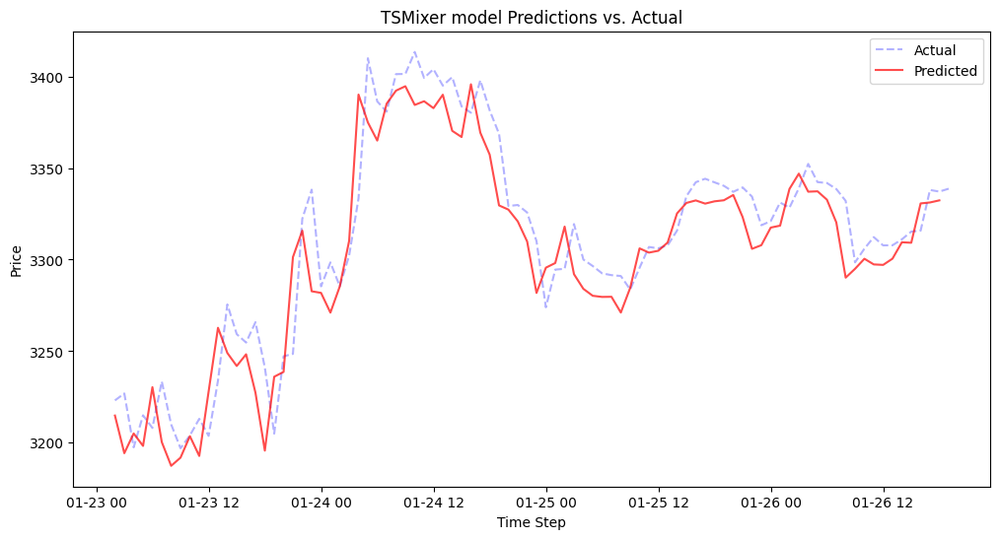

In [99]:
from utils.plots import plot

all_predictions = bt_best_params_test_data['TSMixerPredictions']
all_targets = bt_best_params_test_data['Close']
plot(all_predictions[-90:], all_targets[-90:], "TSMixer model Predictions vs. Actual")

In [100]:
class TechAnalysisWithTSMixerFilterStrategy(Strategy):
    def init(self):
        self.signal = self.I(lambda: self.data.Signal)
        self.tsmixer_prediction = self.I(lambda: self.data.TSMixerPredictions)
        self.previous_signal = 0

    def next(self):
        current_signal = self.signal[-1]
        predicted_close_price = self.tsmixer_prediction[-1]

        if current_signal == 1 and self.data.Close[-1] < predicted_close_price:
            self.position.close()
            self.buy()

        elif current_signal == -1 and self.data.Close[-1] > predicted_close_price:
            self.position.close()
            self.sell()

        self.previous_signal = current_signal

In [101]:
bt_best_params_test_data

,Open,High,Low,Close,Volume,Signal,TSMixerPredictions
Datetime,,,,,,,
2024-01-26 19:00:00,2266.80,2267.09,2251.07,2258.51,14671.9075,0,2252.628662
2024-01-26 20:00:00,2258.51,2262.69,2252.49,2258.60,11646.5910,0,2254.786377
2024-01-26 21:00:00,2258.60,2260.87,2253.00,2259.87,6455.0093,0,2268.181885
2024-01-26 22:00:00,2259.86,2272.00,2258.01,2268.01,6966.3637,0,2271.322754
2024-01-26 23:00:00,2268.01,2270.27,2263.99,2267.68,7176.1758,0,2282.383545
...,...,...,...,...,...,...,...
2025-01-26 15:00:00,3311.09,3320.68,3308.74,3315.31,7303.5872,0,3309.212646
2025-01-26 16:00:00,3315.31,3320.00,3307.96,3315.82,6878.4304,0,3330.695068
2025-01-26 17:00:00,3315.83,3344.88,3315.36,3338.04,9465.0436,0,3331.215820


In [102]:
_ = run_backtest(bt_best_params_test_data, TechAnalysisWithTSMixerFilterStrategy)

Start                     2024-01-26 19:00:00
End                       2025-01-26 19:00:00
Duration                    366 days 00:00:00
Exposure Time [%]                   79.965851
Equity Final [$]                1942467.60586
Equity Peak [$]                 2383360.96586
Return [%]                          94.246761
Buy & Hold Return [%]               47.829321
Return (Ann.) [%]                   93.545186
Volatility (Ann.) [%]              119.443225
Sharpe Ratio                         0.783177
Sortino Ratio                        2.709927
Calmar Ratio                         2.407564
Max. Drawdown [%]                  -38.854699
Avg. Drawdown [%]                   -2.979927
Max. Drawdown Duration      128 days 16:00:00
Avg. Drawdown Duration        4 days 02:00:00
# Trades                                    8
Win Rate [%]                             62.5
Best Trade [%]                      46.273118
Worst Trade [%]                    -13.808887
Avg. Trade [%]                    